In [1]:
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

from tqdm.auto import tqdm
from ggplot import *
from sys import float_info
from collections import namedtuple, OrderedDict
from sklearn.model_selection import ParameterGrid

import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib as mpl
import itertools
import json
import os
import random
import seaborn as sns

import sys
sys.path.append("../..")
from networkentropy import network_energy as ne, network_energy_gradient as neg, network_utils as nu

tqdm.pandas()

In [2]:
METHODS = ['graph', 'laplacian', 'randic']
DI_METHODS = ['graph', 'directed_laplacian', 'randic']

In [3]:
def normalize_list(lizt):
    s = sum(lizt)
    part = 1/s
    return [e*part for e in lizt]

def sums_helper(length, total_sum):
    if length < 1:
        raise ValueError("Length must be positive")
    if length == 1:
        yield (total_sum,)
    else:
        for value in range(1, total_sum):
            for permutation in sums_helper(length-1,total_sum - value):
                yield (value,) + permutation
                
def sums(factors, total_sum):
    perms = sums_helper(len(factors), total_sum)
    result = []
    for row in perms:
        norm_row = normalize_list([e*f for e, f in zip(row, factors)])
        result.append(norm_row)
    return result

In [4]:
ABG = list(sums([0.475, 0.475, 0.05], 4))

REPEATS_NO = 10

N = 100

P_PARAMS = ParameterGrid({'p': np.linspace(0.05, 0.3, 3)})
ERDOS_PARAMS = ParameterGrid({'p': np.linspace(0.05, 0.3, 3)})
HOLME_KIM_M = ParameterGrid({'m': range(2, 5)})
HOLME_KIM_P = ParameterGrid({'p': np.linspace(0.05, 0.7, 3)})
K_OUT_K = ParameterGrid({'k': range(1, 4)})
K_OUT_A = ParameterGrid({'a': range(1, 6, 2)})
PARAMS_A_B_G = [{'a': a, 'b': b, 'g': g} for a, b, g in ABG]

Gen = namedtuple('Gen', ['generator', 'params'])
NETWORKS_GENERATORS = {
    'Erdos-Renyi': Gen(lambda p: nx.erdos_renyi_graph(n=N, p=p), ERDOS_PARAMS),
    'Watts-Strogatz': Gen(lambda p: nx.watts_strogatz_graph(n=N, k=4, p=p), P_PARAMS),
    'Waxman': Gen(lambda p: nx.waxman_graph(n=N, alpha=0.5 + p, beta=0.1), P_PARAMS),
    'Holme-Kim-p.05': Gen(lambda m: nx.powerlaw_cluster_graph(n=N, m=m, p=.05), HOLME_KIM_M),
    'Holme-Kim-m2': Gen(lambda p: nx.powerlaw_cluster_graph(n=N, m=2, p=p), HOLME_KIM_P),
}

DI_NETWORK_GENERATORS = {
    'Erdos-Renyi-directed': Gen(lambda p: nx.erdos_renyi_graph(n=N, p=p, directed=True), ERDOS_PARAMS),
    'k-out-k2': Gen(lambda a: nx.DiGraph(nx.random_k_out_graph(n=N, k=3, alpha=a, self_loops=False)), K_OUT_A),
    'k-out-alpha1': Gen(lambda k: nx.DiGraph(nx.random_k_out_graph(n=N, k=k, alpha=1, self_loops=False)), K_OUT_K),
    'scale-free': Gen(lambda a, b, g: nx.DiGraph(nx.scale_free_graph(alpha=a, beta=b, gamma=g, n=N)), PARAMS_A_B_G)
}

In [5]:
def paramgrid_to_list(param_grid):
    return [next(iter(e.values())) for e in list(param_grid)]

In [6]:
paramgrid_to_list(ERDOS_PARAMS)

[0.05, 0.175, 0.3]

In [7]:
paramgrid_to_list(HOLME_KIM_M)

[2, 3, 4]

In [8]:
paramgrid_to_list(HOLME_KIM_P)

[0.05, 0.37499999999999994, 0.7]

In [9]:
paramgrid_to_list(P_PARAMS)

[0.05, 0.175, 0.3]

In [10]:
[0.5 + p for p in paramgrid_to_list(P_PARAMS)]

[0.55, 0.675, 0.8]

In [11]:
paramgrid_to_list(K_OUT_A)

[1, 3, 5]

In [12]:
paramgrid_to_list(K_OUT_K)

[1, 2, 3]

In [13]:
[[np.round(e, 2) for e in row] for row in ABG]

[[0.45, 0.45, 0.1], [0.32, 0.64, 0.03], [0.64, 0.32, 0.03]]

In [14]:
ABG

[[0.45238095238095233, 0.45238095238095233, 0.09523809523809523],
 [0.3220338983050848, 0.6440677966101696, 0.03389830508474577],
 [0.6440677966101696, 0.3220338983050848, 0.03389830508474577]]

In [15]:
def get_largest_connected_component(g):
    return nx.subgraph(g, max(nx.connected_components(g.to_undirected()), key=len))

In [16]:
def create_graphs(generators: dict):
    graphs = []
    for name, (generator, params) in tqdm(list(generators.items())):
        for i, params_row in enumerate(params):
            for reepat_no in range(REPEATS_NO):
                g = get_largest_connected_component(generator(**params_row))
                row = {**params_row, 'generator': name, 'params_num': i, 'g': g, 'repeat_no': reepat_no,
                       'id': f'{name} {params_row} {reepat_no}'}
                graphs.append(row)
    return pd.DataFrame(graphs)

In [17]:
def calculate_gradients(graphs_df, methods):
    for method in tqdm(methods):
        gradients_df = graphs_df.progress_apply(
                lambda s: neg.get_energy_gradients(s['g'], method, complete=True), axis=1)
        graphs_df = graphs_df.assign(**{method: gradients_df})
    return graphs_df

In [18]:
def flatten_gradients_df(gradients_df, gradients_attrs, additional_attrs = []):
    if len(additional_attrs) <= 0:
        additional_attrs = list(set(gradients_df.columns).difference(gradients_attrs))
    flatten_rows = []
    for _, row in gradients_df.loc[:, gradients_attrs + additional_attrs].iterrows():
        additional_attrs_values = [(attr, val) for attr, val in zip(additional_attrs, row[len(gradients_attrs):])]
        for name, gradients in zip(gradients_attrs, row):
            for edge, value in gradients.items():
                flatten_rows.append(OrderedDict(additional_attrs_values +
                                                [('edge', edge), ('method', name), ('gradient', value)]))
    return pd.DataFrame(flatten_rows)

In [19]:
graphs_df = create_graphs(NETWORKS_GENERATORS)

gradients_df = calculate_gradients(graphs_df, METHODS)

flat_gradients_df = flatten_gradients_df(gradients_df, METHODS)

### Visualization of energy gradients distributions in synthetic networks

Every network has been created with a few different parameters

In [20]:
PLOTS_PATH = "energy-gradient-plots/"
if not os.path.exists(PLOTS_PATH):
    os.mkdir(PLOTS_PATH)

In [21]:
flat_gradients_df.head()

,repeat_no,m,p,id,generator,g,params_num,edge,method,gradient
0,0,NaN,0.05,Erdos-Renyi {'p': 0.05} 0,Erdos-Renyi,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0,"(0, 7)",graph,0.588998
1,0,NaN,0.05,Erdos-Renyi {'p': 0.05} 0,Erdos-Renyi,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0,"(7, 0)",graph,-0.588998
2,0,NaN,0.05,Erdos-Renyi {'p': 0.05} 0,Erdos-Renyi,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0,"(0, 31)",graph,4.377860
3,0,NaN,0.05,Erdos-Renyi {'p': 0.05} 0,Erdos-Renyi,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0,"(31, 0)",graph,-4.377860
4,0,NaN,0.05,Erdos-Renyi {'p': 0.05} 0,Erdos-Renyi,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0,"(0, 58)",graph,-3.753324


In [22]:
def plot_distributions(data, col, row, title, file_name, hue=None, add_legend=True, adjust_top=0.92):
    sns.reset_orig()
    sns.set(font_scale=1.3)
    g = sns.FacetGrid(data, col=col, row=row, hue=hue, 
                  sharex=False, sharey=False,
                  height=3, aspect=1.5, legend_out=False, margin_titles=True)
    g = g.map(sns.distplot, "gradient", kde_kws={"lw": 3})
    if add_legend:
        g = g.add_legend()
    g.fig.subplots_adjust(top=adjust_top)
    g.fig.suptitle(title, fontsize=16)
    [plt.setp(ax.texts, text="") for ax in g.axes.flat]
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}')
    g.savefig(f"{PLOTS_PATH}{file_name}")
    return g

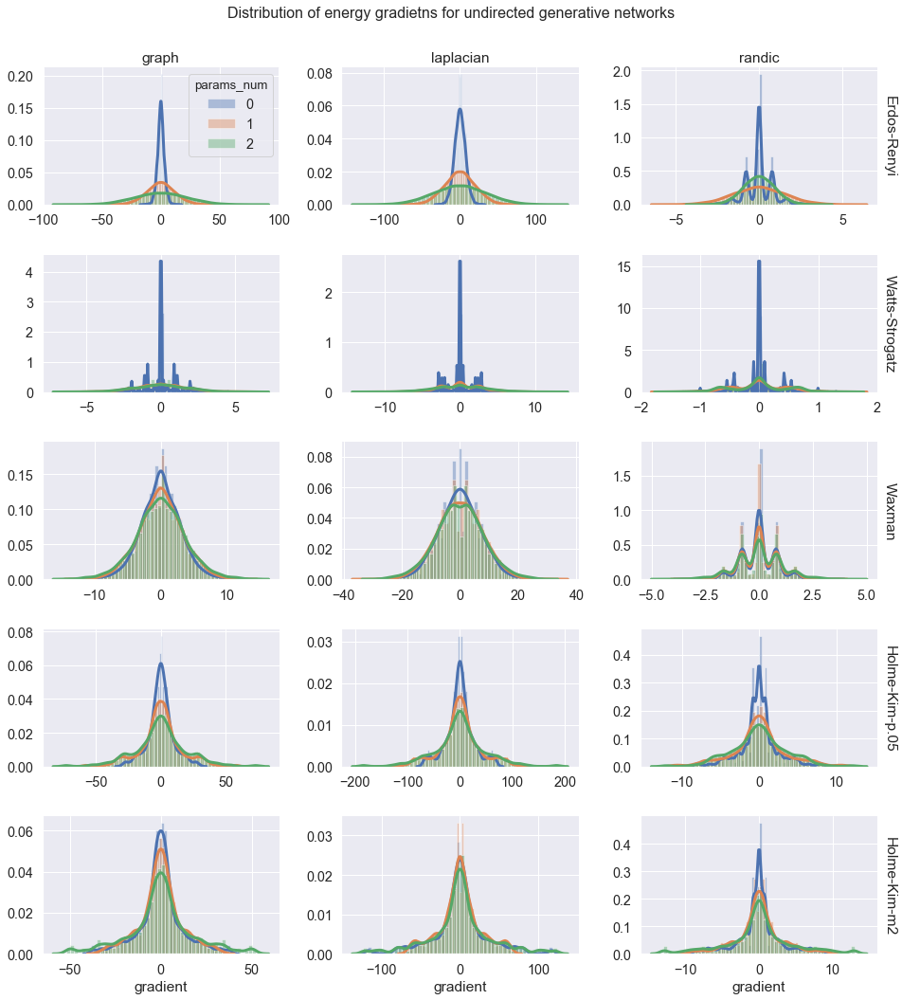

In [23]:
plot_distributions(data=flat_gradients_df, col="method", row="generator", hue="params_num",
                  title="Distribution of energy gradietns for undirected generative networks",
                  file_name="energy-gradient-undirected-dist2.pdf")

In [24]:
di_graphs_df = create_graphs(DI_NETWORK_GENERATORS)
di_gradients_df = calculate_gradients(di_graphs_df, DI_METHODS)
di_flat_gradients_df = flatten_gradients_df(di_gradients_df, DI_METHODS)

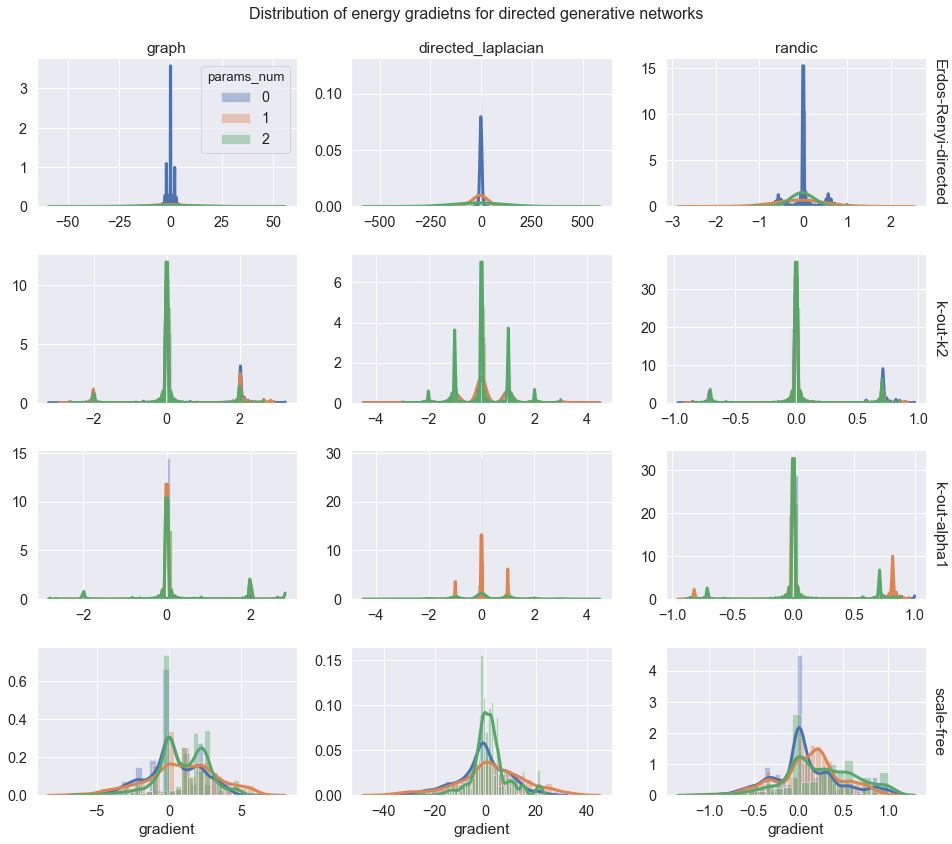

In [25]:
plot_distributions(data=di_flat_gradients_df, col="method", row="generator", hue="params_num",
                  title="Distribution of energy gradietns for directed generative networks",
                  file_name="energy-gradient-directed-dist2.pdf")

### Visualization of energy gradients distributions in empirical networks

Directed graphs have been chaged to undirected representation

In [26]:
datasets = nu.create_datasets('konect.uni')
filtered_datasets = datasets.filter(directed=False, min_size=200, max_size=1500, max_density=0.1)
empirical_networks_df = filtered_datasets.download_and_build_networks().rename(columns={'graph': 'g'})
largest_component_df = empirical_networks_df.progress_apply(lambda s: get_largest_connected_component(s['g']), axis=1)
largest_component_n_df = largest_component_df.progress_apply(lambda g: nx.number_of_nodes(g))
print(largest_component_n_df)
empirical_networks_df = empirical_networks_df.assign(g=largest_component_df)
empirical_gradients_df = calculate_gradients(empirical_networks_df, METHODS)
empirical_flat_gradients_df = flatten_gradients_df(empirical_gradients_df, METHODS)


27       453
34       823
44       829
75      1039
147      161
192     1133
193    34414
195      791
dtype: int64


In [194]:
empirical_networks_df

,name,category,directed,num_nodes,num_edges,tsv_url,g
27,arenas-meta,Metabolic,False,453,4596,http://konect.uni-koblenz.de/downloads/tsv/are...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
34,tntp-ChicagoRegional,Infrastructure,False,1467,1298,http://konect.uni-koblenz.de/downloads/tsv/tnt...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
44,moreno_crime,Interaction,False,1380,1476,http://konect.uni-koblenz.de/downloads/tsv/mor...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
75,subelj_euroroad,Infrastructure,False,1174,1417,http://konect.uni-koblenz.de/downloads/tsv/sub...,"(6, 7, 880, 8, 22, 23, 411, 453, 454, 889, 9, ..."
147,maayan-pdzbase,Metabolic,False,212,244,http://konect.uni-koblenz.de/downloads/tsv/maa...,"(1, 180, 2, 114, 137, 3, 107, 121, 149, 164, 1..."
192,arenas-email,Communication,False,1133,5451,http://konect.uni-koblenz.de/downloads/tsv/are...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
193,opsahl-ucforum,Interaction,False,1421,33720,http://konect.uni-koblenz.de/downloads/tsv/ops...,"(1, 1084560796, 2, 1084560848, 3, 1084560940, ..."
195,unicodelang,Feature,False,868,1255,http://konect.uni-koblenz.de/downloads/tsv/uni...,"(31, 18, 1, 221, 28, 0.018, 185, 12, 0, 38, 87..."


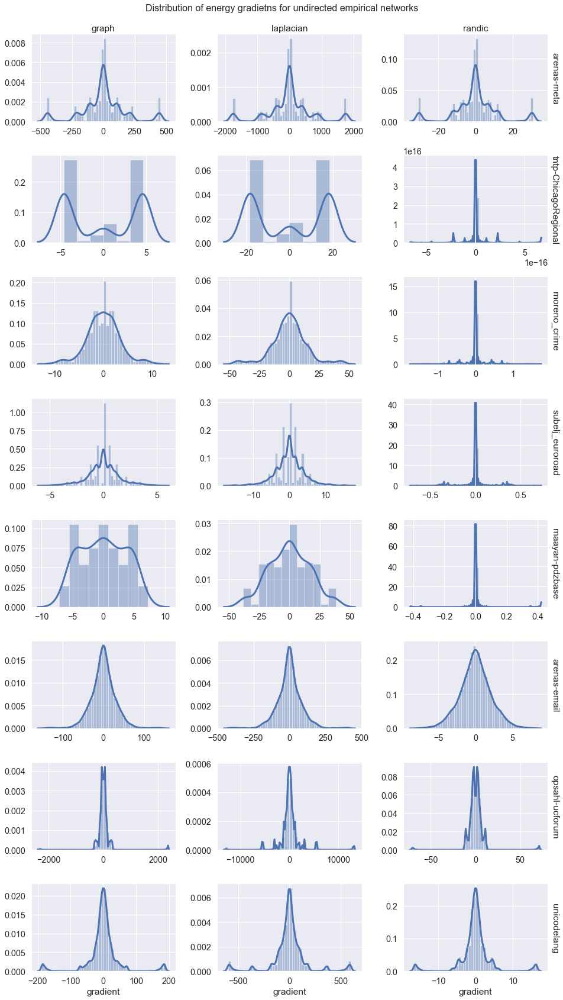

In [212]:
plot_distributions(data=empirical_flat_gradients_df, col="method", row="name",
                  title="Distribution of energy gradietns for undirected empirical networks",
                  file_name="empirical-energy-gradient-dist.pdf", add_legend=False, adjust_top=0.95)

In [195]:
di_filtered_datasets = datasets.filter(directed=True, min_size=200, max_size=1500, max_density=0.1)
di_empirical_networks_df = di_filtered_datasets.download_and_build_networks().rename(columns={'graph': 'g'})
di_largest_component_df = di_empirical_networks_df.progress_apply(lambda s: get_largest_connected_component(s['g']), axis=1)
di_largest_component_n_df = di_largest_component_df.progress_apply(lambda g: nx.number_of_nodes(g))
print(di_largest_component_n_df)
di_empirical_networks_df = di_empirical_networks_df.assign(g=di_largest_component_df)
di_empirical_gradients_df = calculate_gradients(di_empirical_networks_df, DI_METHODS)
di_empirical_flat_gradients_df = flatten_gradients_df(di_empirical_gradients_df, DI_METHODS)

4      1226
23     1222
149     117
160     217
dtype: int64


In [196]:
di_empirical_networks_df

,name,category,directed,num_nodes,num_edges,tsv_url,g
4,maayan-faa,Infrastructure,True,1226,2615,http://konect.uni-koblenz.de/downloads/tsv/maa...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
23,moreno_blogs,Hyperlink,True,1224,19025,http://konect.uni-koblenz.de/downloads/tsv/mor...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
149,moreno_innovation,HumanSocial,True,241,1098,http://konect.uni-koblenz.de/downloads/tsv/mor...,"(96, 5, 23, 17, 67, 60, 20, 19, 10, 73, 27, 43..."
160,moreno_oz,HumanSocial,True,217,2672,http://konect.uni-koblenz.de/downloads/tsv/mor...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."


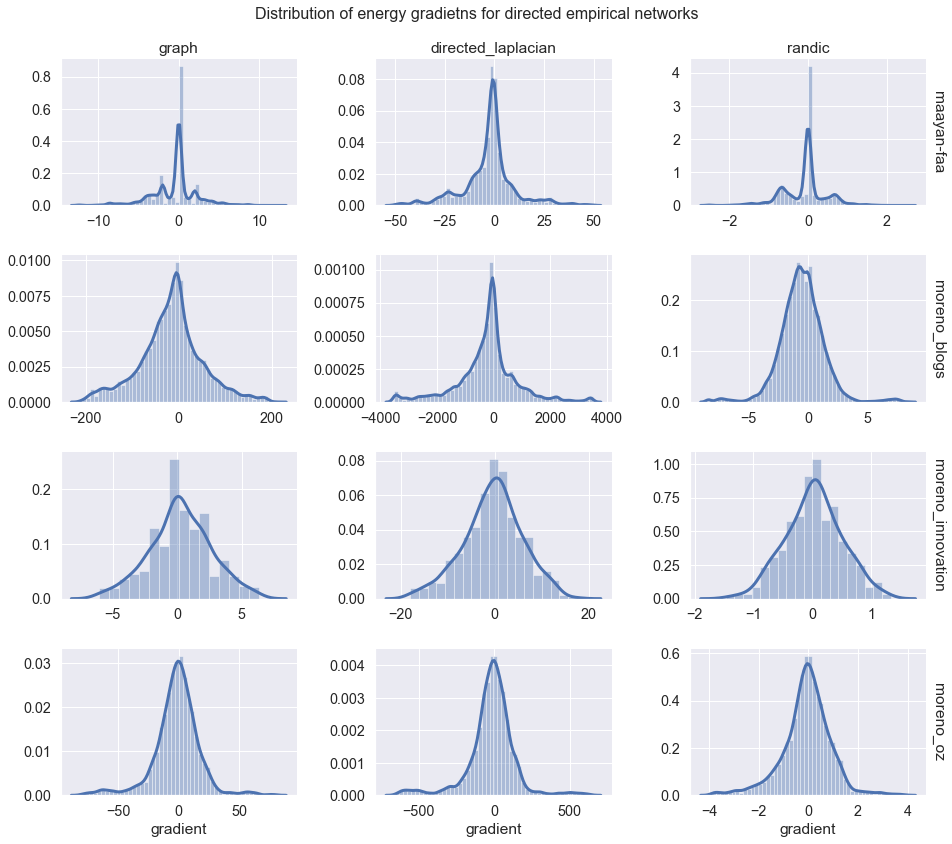

In [200]:
plot_distributions(data=di_empirical_flat_gradients_df, col="method", row="name",
                  title="Distribution of energy gradietns for directed empirical networks",
                  file_name="empirical-directed-energy-gradient-dist.pdf", add_legend=False)

### Visualization of gradients

In [284]:
NETWORKS_PLOTS_PATH = "energy-gradient-networks-plots/"
if not os.path.exists(NETWORKS_PLOTS_PATH):
    os.mkdir(NETWORKS_PLOTS_PATH)

In [287]:
DrawDataEntry = namedtuple('DrawDataEntry', 
                           ['p', 'generator', 'method', 'g', 'energies', 'gradients',
                           'min_energy', 'max_energy', 'min_gradient', 'max_gradient'])
    
def normalize_list(lizt, target=1.0):
    min_val = min(lizt)
    if min_val < 0:
        lizt = [v - min_val for v in lizt]
    list_sum = sum(lizt)
    factor = target/list_sum
    return [value*factor for value in lizt]
    
def precompute_draw_data(graphs_df, methods):
    entries = []
    for _, (G, generator, idd, p) in tqdm(list(graphs_df.loc[:,['g', 'generator', 'id', 'params_num']].iterrows())):
        if G.is_directed():
            G = G.to_undirected()
        neg.get_graph_with_energy_data(G, methods=methods, copy=False)
        for method in methods:
            energies = np.array(list(nx.get_node_attributes(G, f'{method}_energy').values()))
            gradients = np.array([np.abs(g) for g in nx.get_edge_attributes(G, f'{method}_gradient').values()])
#             energies = normalize_list(energies)
#             gradients = normalize_list(gradients)
            entries.append(DrawDataEntry(
                p, generator, method, G, energies, gradients,
                np.min(energies), np.max(energies), 
                np.min(gradients), np.max(gradients)
            ))
    return pd.DataFrame(list(map(lambda e: e._asdict(), entries)))     
        
def get_vmin_vmax(df, p, method, generator, attr, vstrategy=""):
    strategies = vstrategy.split('+')
    vp_values, vmethods, vgenerators = list(df['p'].unique()), list(df['method'].unique()), list(df['generator'].unique())
    if 'p' in strategies:
        vp_values = [p]
    if 'method' in strategies:
        vmethods = [method]
    if 'generator' in strategies:
        vgenerators = [generator]
            
    filtered_df = df.query("p in @vp_values and method in @vmethods and generator in @vgenerators")
    
    min_value = filtered_df[f'min_{attr}'].min()
    max_value = filtered_df[f'max_{attr}'].max()
    
    return min_value, max_value

def get_vmin_vmax_energy(df, p, generator, method, vstrategy):
    return get_vmin_vmax(df=df, p=p, generator=generator, method=method, attr='energy', vstrategy=vstrategy)

def get_vmin_vmax_gradient(df, p, generator, method, vstrategy):
    return get_vmin_vmax(df=df, p=p, generator=generator, method=method, attr='gradient', vstrategy=vstrategy)
    
def draw_network(draw_df, p, generator, method, vstrategy='', vstrategy_gradient=''):
    vmin, vmax = get_vmin_vmax_energy(df=draw_df, p=p, generator=generator, method=method, vstrategy=vstrategy)
    edge_vmin, edge_vmax = get_vmin_vmax_gradient(df=draw_df, p=p, generator=generator, method=method, vstrategy=vstrategy_gradient)
    G, energies, gradients = list(draw_df.query("p == @p and generator == @generator and method == @method")\
                    .loc[:,['g', 'energies', 'gradients']].iloc[0])        
    pos = nx.layout.kamada_kawai_layout(G)
    plt.figure(figsize=(18,12))
    nodes = nx.draw_networkx_nodes(G, pos, node_size=[e*40 for e in energies], node_color=energies, cmap=plt.cm.coolwarm, 
                                   vmin=vmin, vmax=vmax, with_labels=False)
    edges = nx.draw_networkx_edges(G, pos, edge_vmin=edge_vmin, edge_vmax=edge_vmax, 
                                   edge_color=gradients, edge_cmap=plt.cm.Reds, width=2, with_labels=False)
    edges_cbar = plt.colorbar(edges)
    edges_cbar.ax.set_title('gradient')
    nodes_cbar = plt.colorbar(nodes)
    nodes_cbar.ax.set_title('energy')
    plt.title(f'Generator: {generator}, Method: {method}, param_num: {p}')
    plt.axis('off')
    plt.savefig(f'{NETWORKS_PLOTS_PATH}{generator}-{method}-{p}.pdf')
    plt.show()
    
def draw_networks(graphs_df, methods, vstrategy, vstrategy_gradient, p=None, generator=None, sort_by=None):
    graphs_df = graphs_df[graphs_df['repeat_no'] == 0]
    if p is not None:
        graphs_df = graphs_df[graphs_df['params_num'] == p]
    if generator is not None:
        graphs_df = graphs_df[graphs_df['generator'] == generator]
    draw_df = precompute_draw_data(graphs_df, methods=methods)
    if sort_by:
        draw_df = draw_df.sort_values(sort_by)
    for _, (generator, method) in draw_df.loc[:, ['generator', 'method']].iterrows():
        draw_network(draw_df, p, generator, method, vstrategy, vstrategy_gradient)

### Visualization of graph energy and graph energy gradients in sythetic networks

Graphs for every energy computiong method share common colorbars. It can be easilty changed using parameter vstrategy.
For example value: `'p+method+genrator'` would result in separete colorbar for every plot
and value: `p+generator` would result in sharing colorbars between plots with same generator

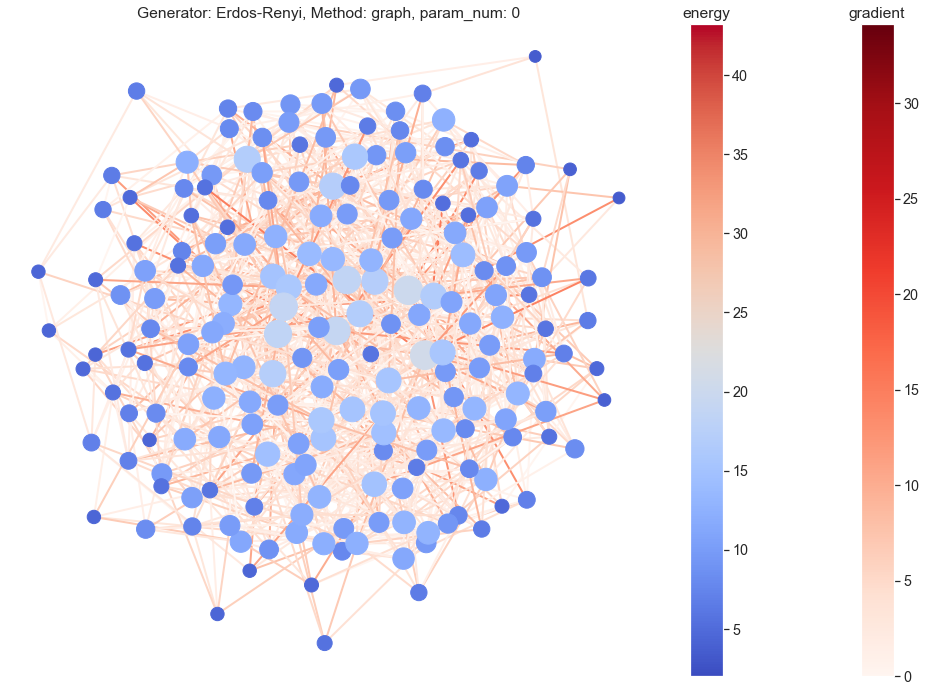

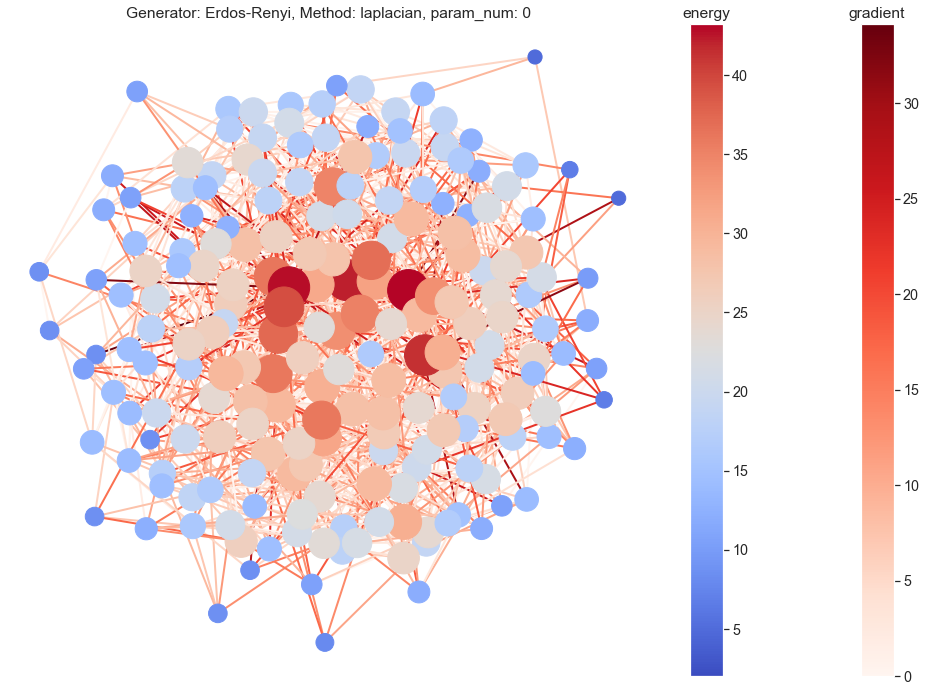

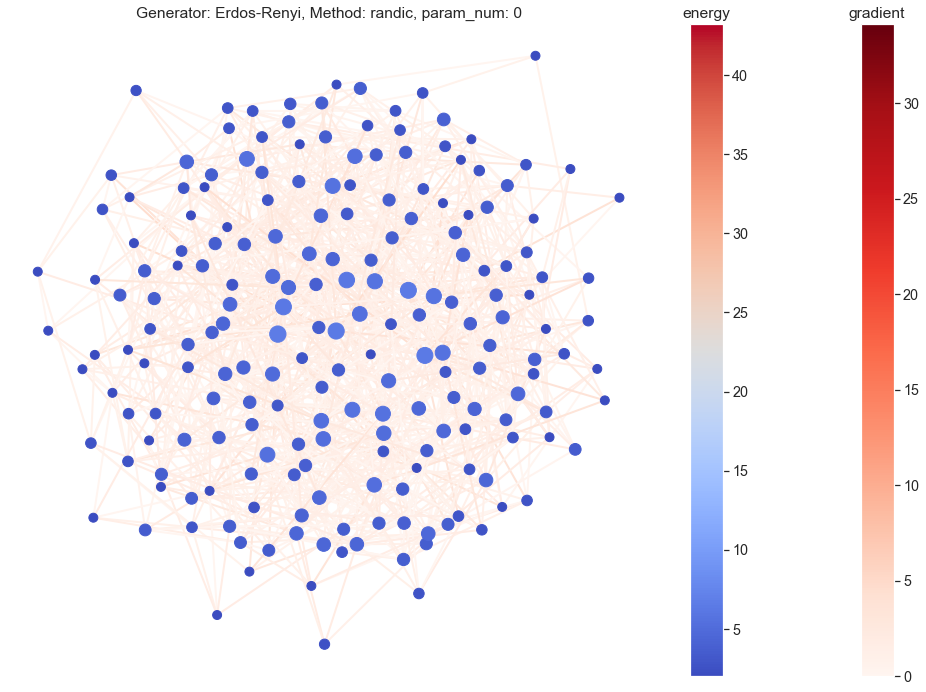

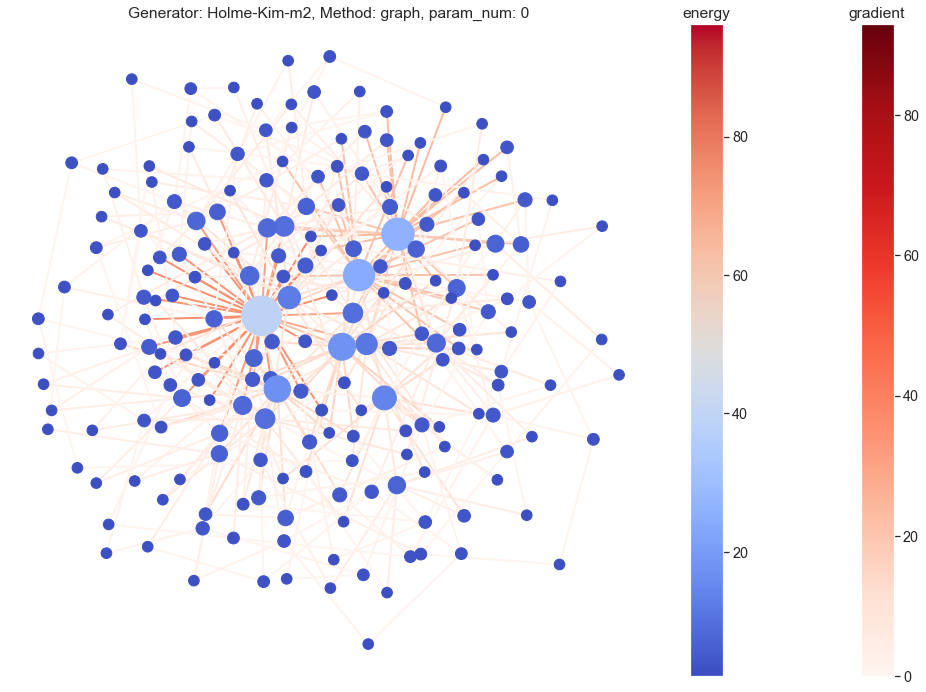

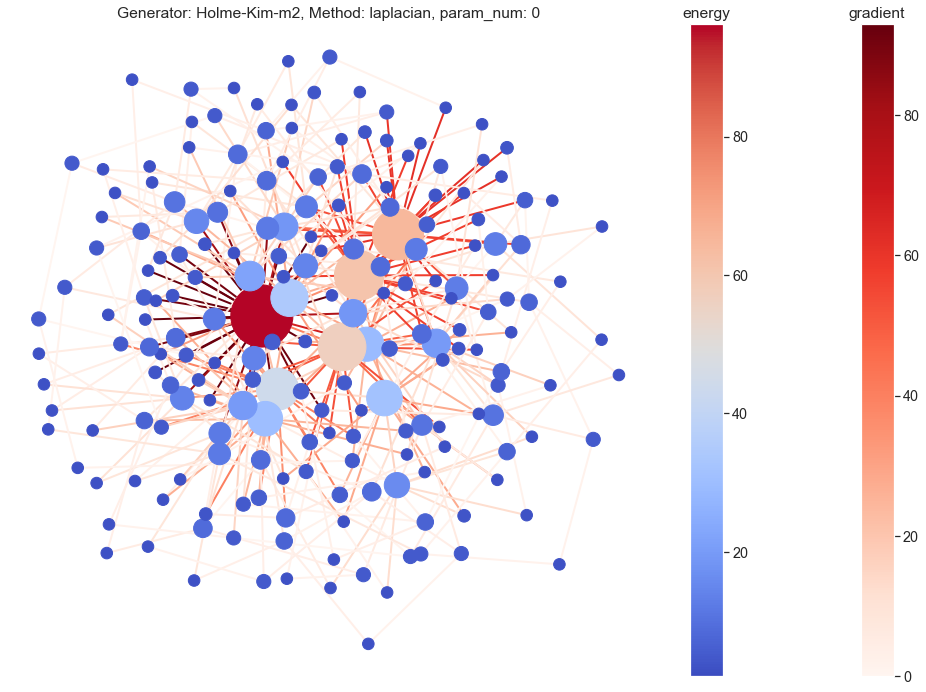

...

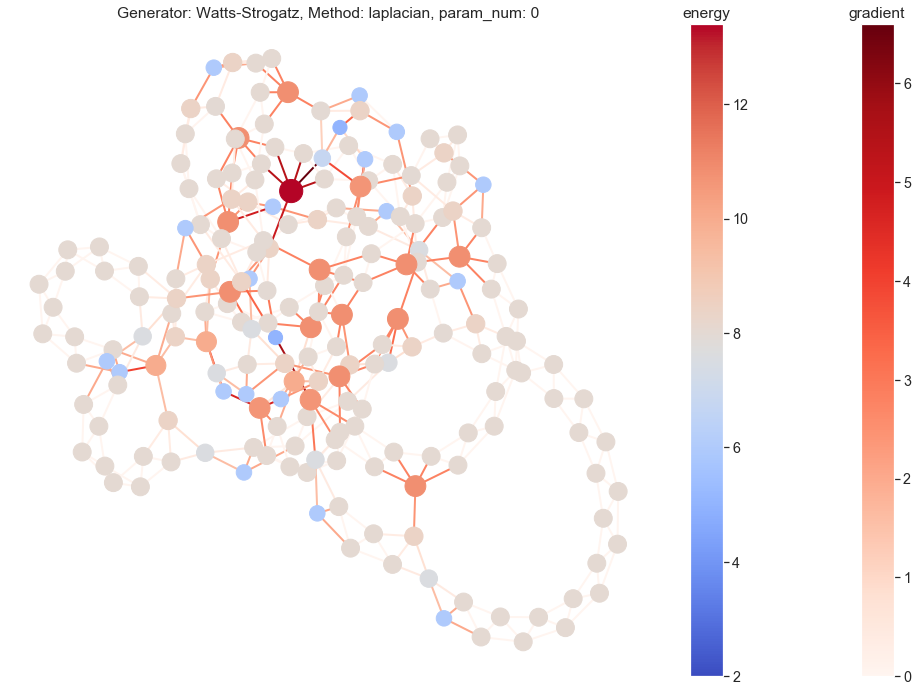

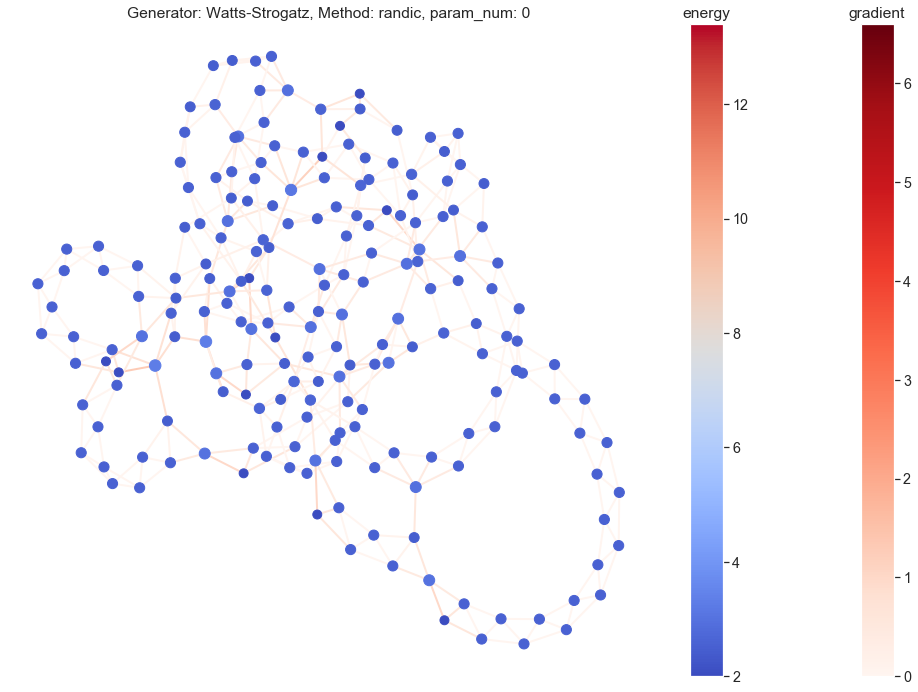

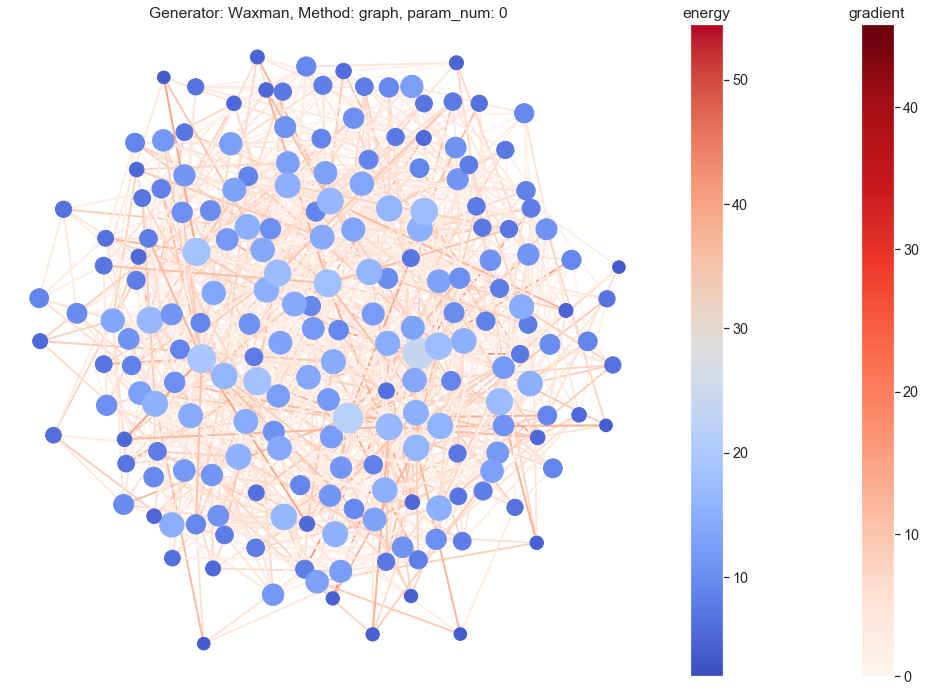

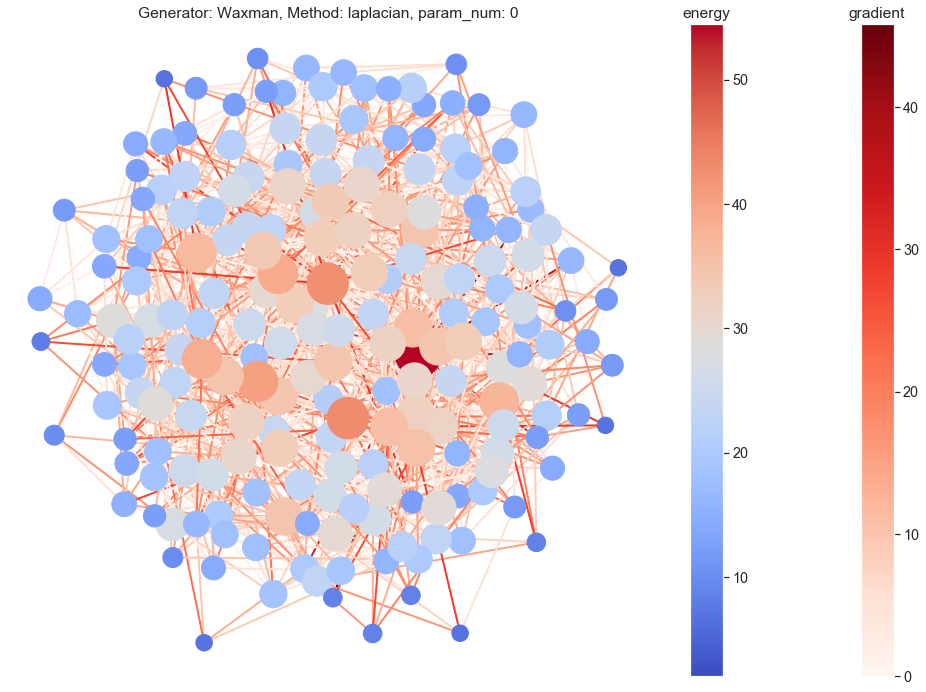

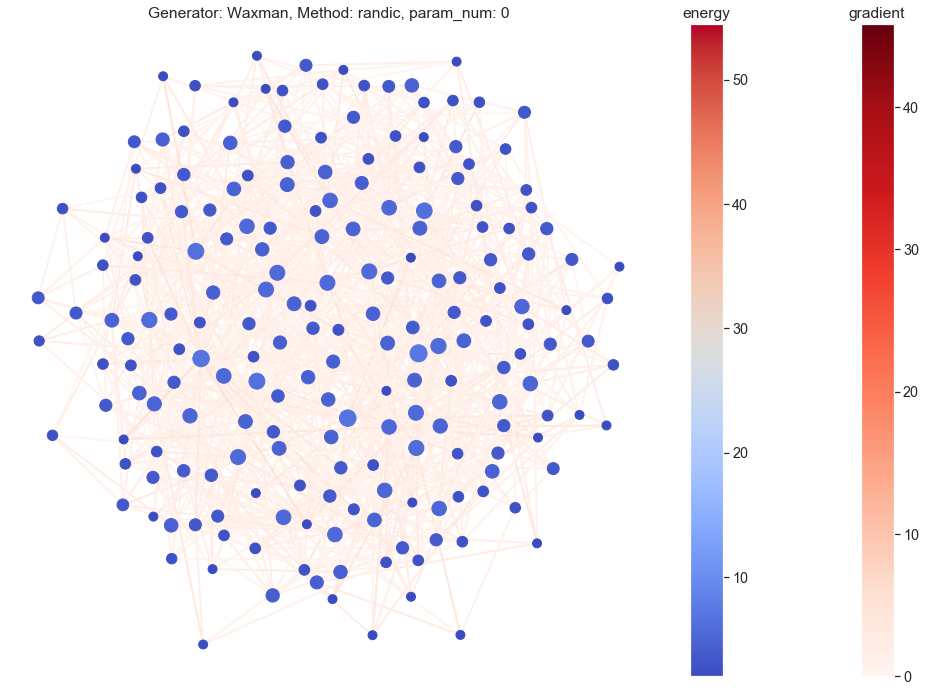

In [288]:
draw_networks(graphs_df, methods=METHODS, p=0, vstrategy='p+generator', vstrategy_gradient='p+generator', sort_by='generator')

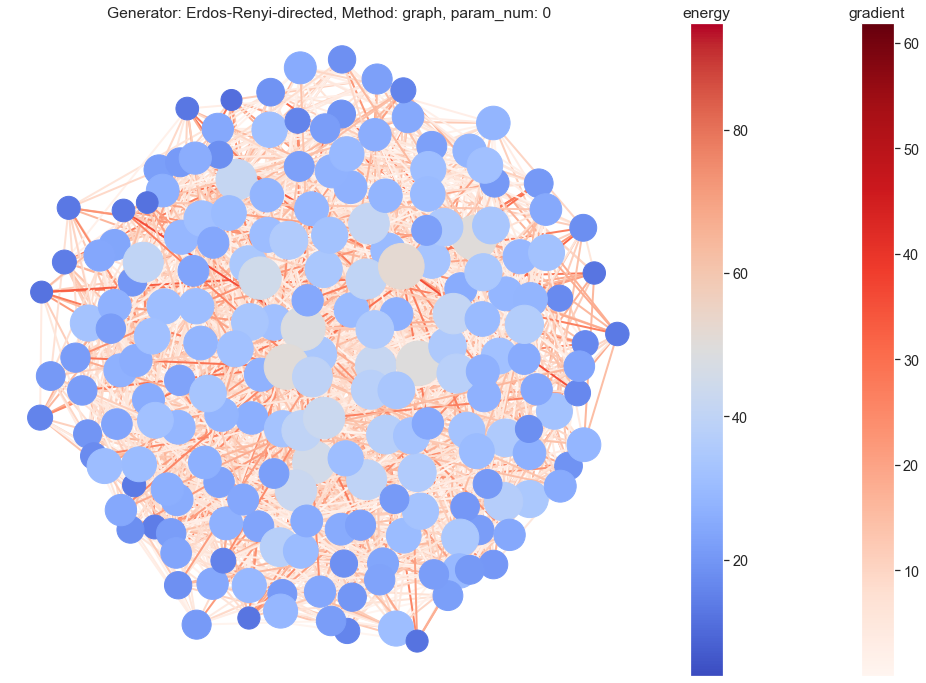

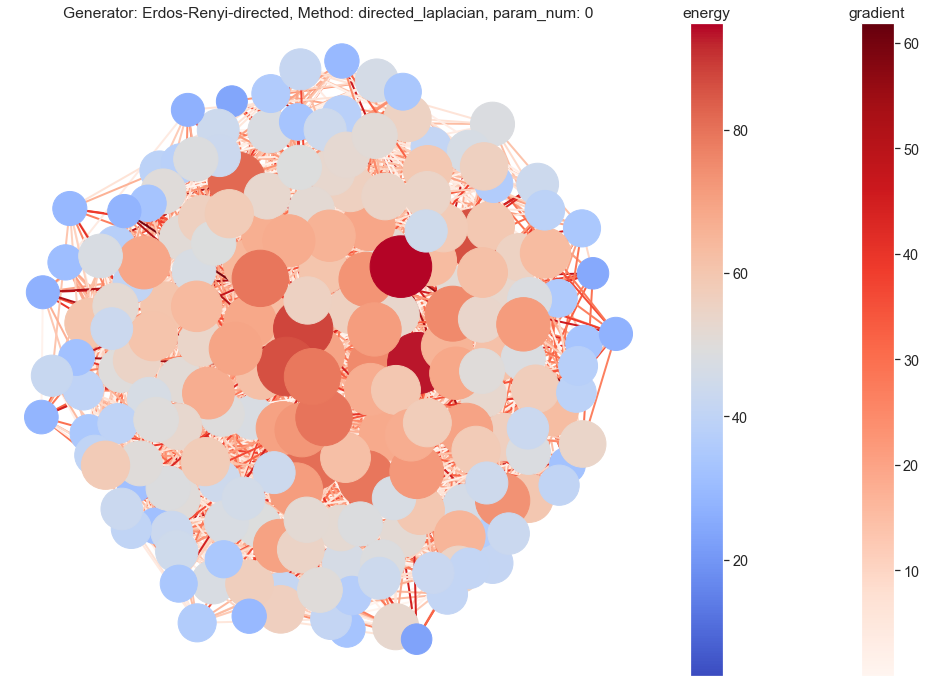

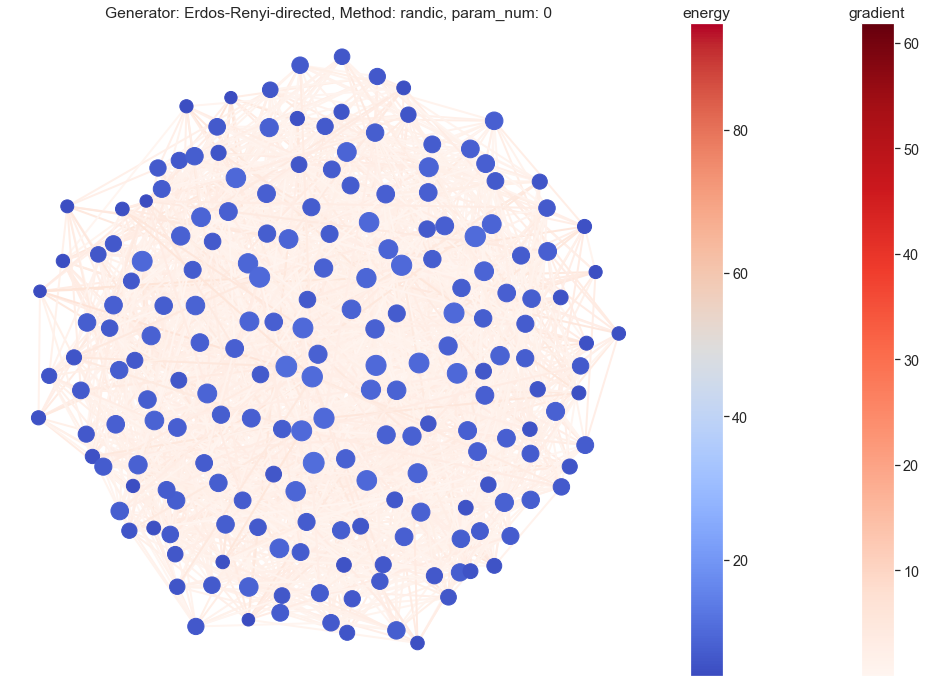

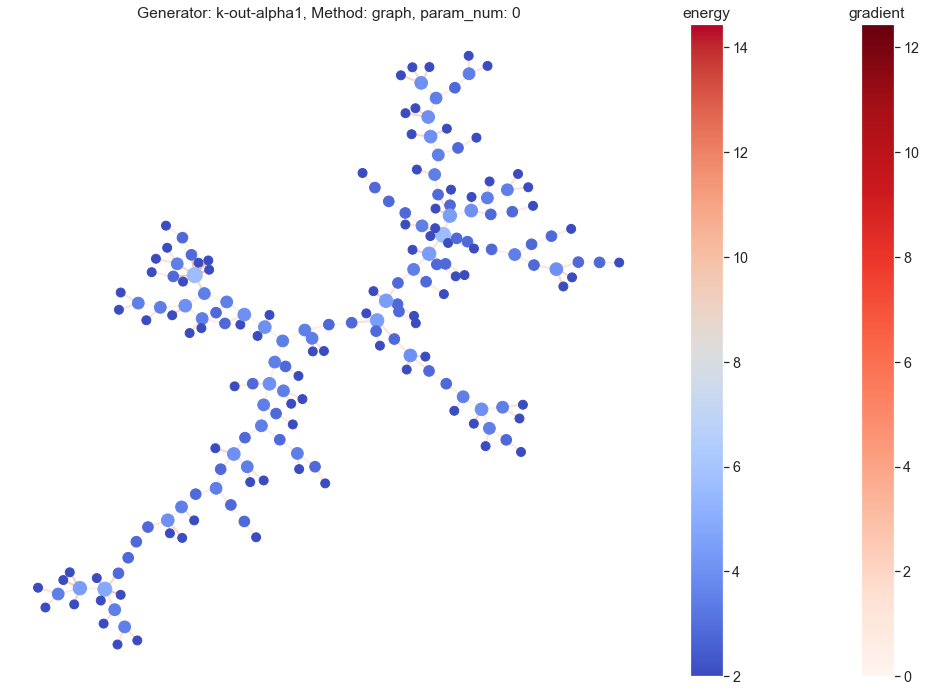

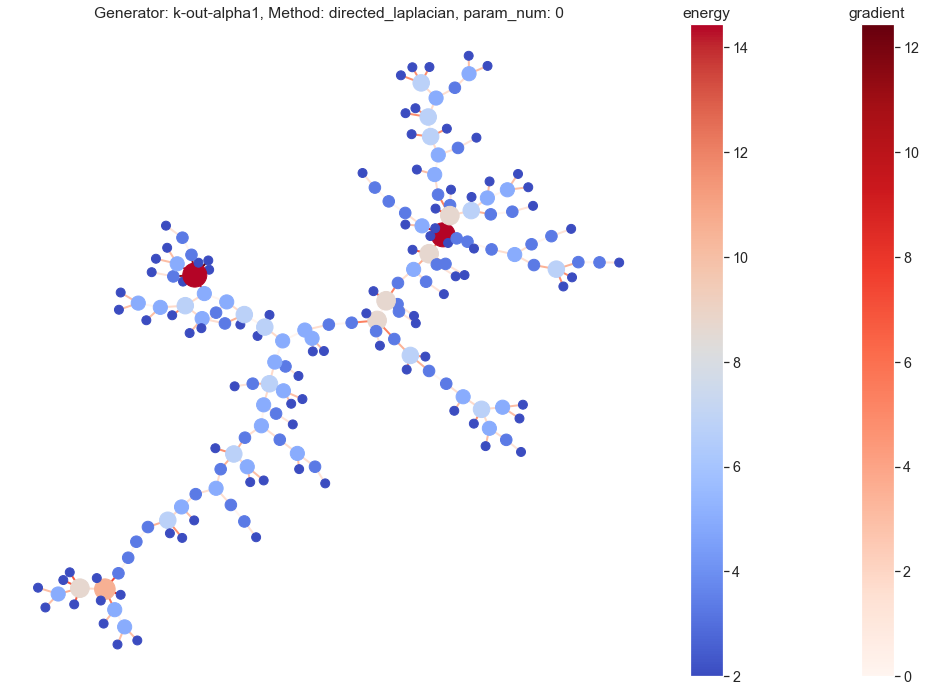

...

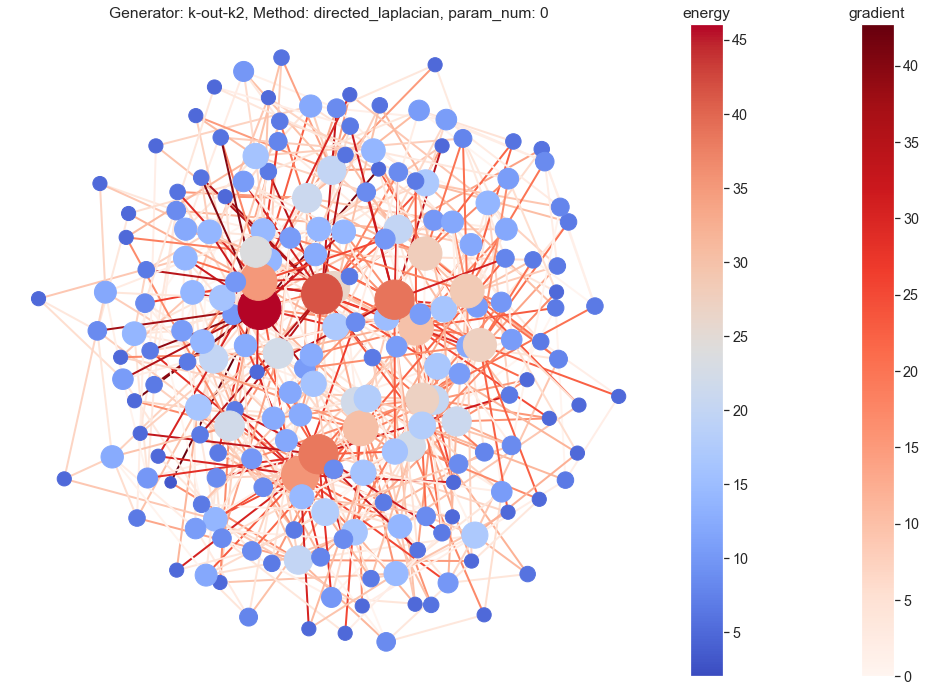

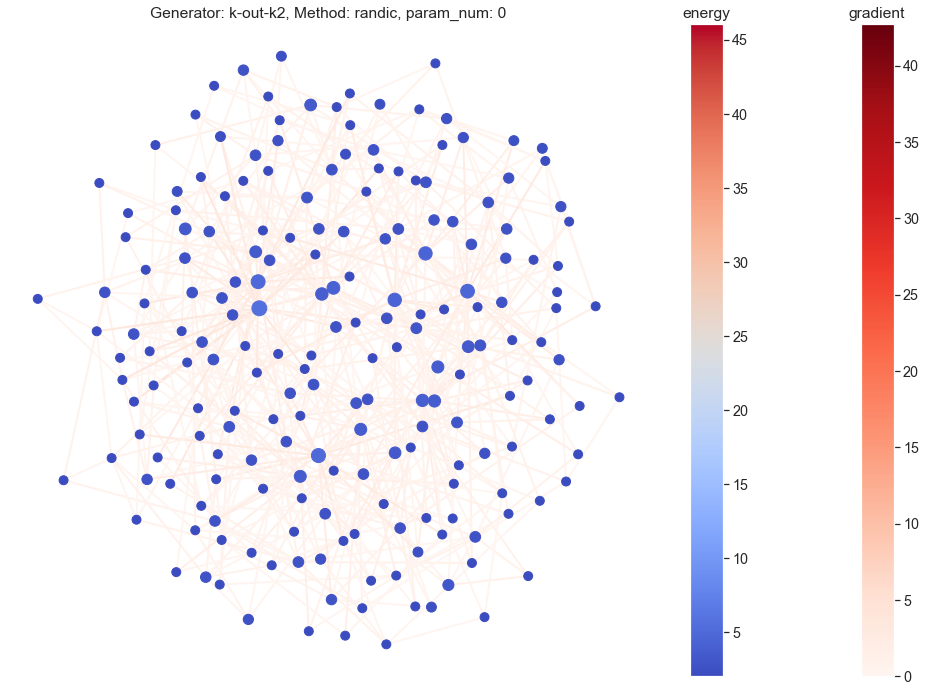

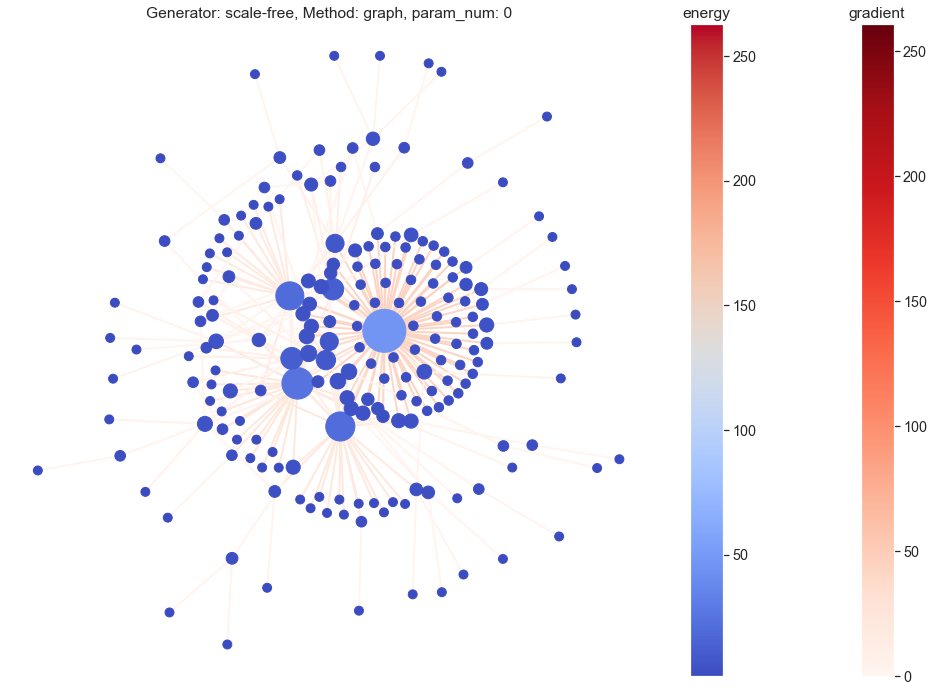

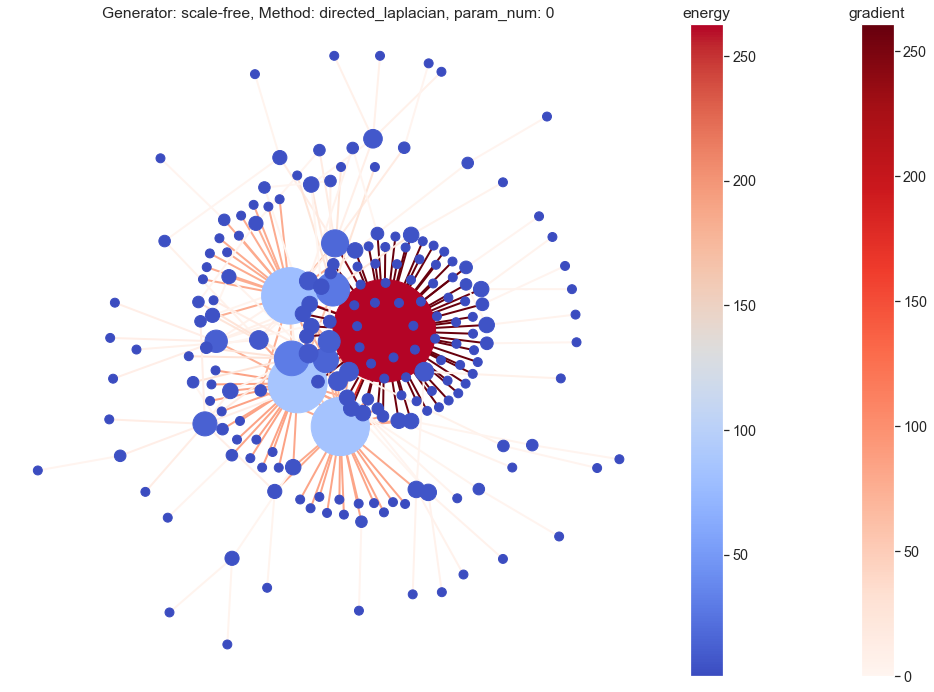

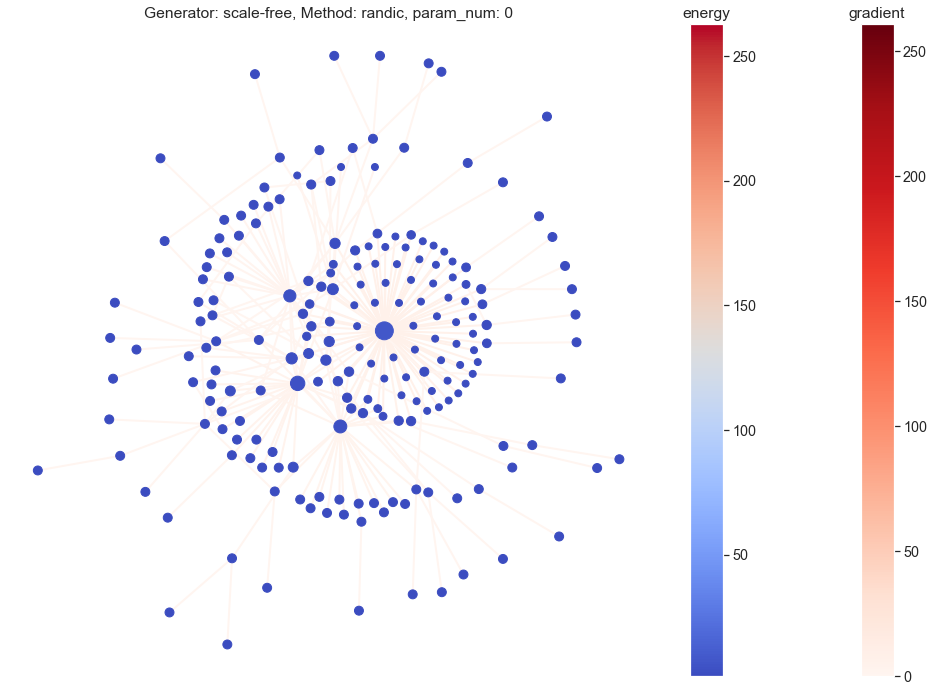

In [177]:
draw_networks(di_graphs_df, p=0, methods=DI_METHODS, vstrategy='p+generator', vstrategy_gradient='p+generator', sort_by='generator')

### Visualization of gradients of empirical networks

Every graph has independent colorbar. It can be changes using parameter `vstrategy`

In [178]:
empirical_networks_df.head()

,name,category,directed,num_nodes,num_edges,tsv_url,g
27,arenas-meta,Metabolic,False,453,4596,http://konect.uni-koblenz.de/downloads/tsv/are...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
34,tntp-ChicagoRegional,Infrastructure,False,1467,1298,http://konect.uni-koblenz.de/downloads/tsv/tnt...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
44,moreno_crime,Interaction,False,1380,1476,http://konect.uni-koblenz.de/downloads/tsv/mor...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
75,subelj_euroroad,Infrastructure,False,1174,1417,http://konect.uni-koblenz.de/downloads/tsv/sub...,"(1, 2, 3, 17, 4, 5, 855, 6, 7, 880, 8, 22, 23,..."
147,maayan-pdzbase,Metabolic,False,212,244,http://konect.uni-koblenz.de/downloads/tsv/maa...,"(1, 180, 2, 114, 137, 3, 107, 121, 149, 164, 1..."


In [316]:
DrawEmpDataEntry = namedtuple('DrawEmpDataEntry', 
                           ['name', 'method', 'g', 'energies', 'gradients',
                           'min_energy', 'max_energy', 'min_gradient', 'max_gradient'])

def precompute_draw_data_emp(graphs_df, methods):
    entries = []
    for _, (G, name) in tqdm(list(graphs_df.loc[:,['g', 'name']].iterrows())):
        if G.is_directed():
            G = G.to_undirected()
        neg.get_graph_with_energy_data(G, methods=methods, copy=False)
        for method in methods:
            energies = np.array(list(nx.get_node_attributes(G, f'{method}_energy').values()))
            gradients = np.array([np.abs(g) for g in nx.get_edge_attributes(G, f'{method}_gradient').values()])
#             energies = normalize_list(energies)
#             gradients = normalize_list(gradients)
            entries.append(DrawEmpDataEntry(
                name, method, G, energies, gradients,
                np.min(energies), np.max(energies), 
                np.min(gradients), np.max(gradients)
            ))
    return pd.DataFrame(list(map(lambda e: e._asdict(), entries)))     
        
def get_vmin_vmax_emp(df, method, name, attr, vstrategy=""):
    strategies = vstrategy.split('+')
    vmethods, vnames = list(df['method'].unique()), list(df['name'].unique())
    if 'method' in strategies:
        vmethods = [method]
    if 'name' in strategies:
        vnames = [name]
            
    filtered_df = df.query("method in @vmethods and name in @vnames")
    
    min_value = filtered_df[f'min_{attr}'].min()
    max_value = filtered_df[f'max_{attr}'].max()
    
    return min_value, max_value

def get_vmin_vmax_energy_emp(df, name, method, vstrategy):
    return get_vmin_vmax_emp(df=df, name=name, method=method, attr='energy', vstrategy=vstrategy)

def get_vmin_vmax_gradient_emp(df, name, method, vstrategy):
    return get_vmin_vmax_emp(df=df, name=name, method=method, attr='gradient', vstrategy=vstrategy)
    
def draw_network_emp(draw_df, name, method, vstrategy='', vstrategy_gradient='', scale_factor=10):
    vmin, vmax = get_vmin_vmax_energy_emp(df=draw_df, name=name, method=method, vstrategy=vstrategy)
    edge_vmin, edge_vmax = get_vmin_vmax_gradient_emp(df=draw_df, name=name, method=method, vstrategy=vstrategy_gradient)
    G, energies, gradients = list(draw_df.query("method == @method and name == @name")\
                    .loc[:,['g', 'energies', 'gradients']].iloc[0])        
    pos = nx.layout.kamada_kawai_layout(G)
    plt.figure(figsize=(18,12))
    nodes = nx.draw_networkx_nodes(G, pos, node_size=[e*scale_factor for e in energies], node_color=energies, cmap=plt.cm.coolwarm, 
                                   vmin=vmin, vmax=vmax, with_labels=False)
    edges = nx.draw_networkx_edges(G, pos, edge_vmin=edge_vmin, edge_vmax=edge_vmax, 
                                   edge_color=gradients, edge_cmap=plt.cm.Reds, width=2, with_labels=False)
    edges_cbar = plt.colorbar(edges)
    edges_cbar.ax.set_title('gradient')
    nodes_cbar = plt.colorbar(nodes)
    nodes_cbar.ax.set_title('energy')
    plt.title(f'Name: {name}, Method: {method}')
    plt.axis('off')
    plt.savefig(f'{name}-{method}.pdf')
    plt.show()
    
def draw_networks_emp(graphs_df, methods, vstrategy='', vstrategy_gradient='', sort_by=None, scale_factor=10):
    draw_df = precompute_draw_data_emp(graphs_df, methods=methods)
    if sort_by:
        draw_df = draw_df.sort_values(sort_by)
    for _, (name, method) in draw_df.loc[:, ['name', 'method']].iterrows():
        draw_network_emp(draw_df, name, method, vstrategy, vstrategy_gradient)
    return draw_df

### Visualization of graph energies and graph gradients

In [317]:
filtered_datasets_to_draw = datasets.filter(directed=False, min_size=100, max_size=1500, max_density=0.1)
empirical_networks_to_draw_df = filtered_datasets_to_draw.download_and_build_networks().rename(columns={'graph': 'g'})
largest_component_to_draw_df = empirical_networks_o_draw_df.progress_apply(lambda s: get_largest_connected_component(s['g']), axis=1)
largest_component_n_to_draw_df = largest_component_to_draw_df.progress_apply(lambda g: nx.number_of_nodes(g))
print(largest_component_n_to_draw_df)
empirical_networks_to_draw_df = empirical_networks_to_draw_df.assign(real_num_nodes=largest_component_n_to_draw_df)
empirical_networks_to_draw_df = empirical_networks_to_draw_df.assign(g=largest_component_to_draw_df)
empirical_networks_to_draw_df = empirical_networks_to_draw_df.query('real_num_nodes <= 1500')

8        136
27       453
34       823
44       829
45       112
75      1039
112      198
147      161
192     1133
193    34414
195      791
dtype: int64


In [318]:
empirical_networks_to_draw_df

,name,category,directed,num_nodes,num_edges,tsv_url,g,real_num_nodes
8,brunson_revolution,Affiliation,False,141,160,http://konect.uni-koblenz.de/downloads/tsv/bru...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",136
27,arenas-meta,Metabolic,False,453,4596,http://konect.uni-koblenz.de/downloads/tsv/are...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",453
34,tntp-ChicagoRegional,Infrastructure,False,1467,1298,http://konect.uni-koblenz.de/downloads/tsv/tnt...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",823
44,moreno_crime,Interaction,False,1380,1476,http://konect.uni-koblenz.de/downloads/tsv/mor...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",829
45,adjnoun_adjacency,Lexical,False,112,425,http://konect.uni-koblenz.de/downloads/tsv/adj...,"(1, 2, 3, 9, 14, 18, 19, 20, 29, 42, 46, 47, 5...",112
75,subelj_euroroad,Infrastructure,False,1174,1417,http://konect.uni-koblenz.de/downloads/tsv/sub...,"(6, 7, 880, 8, 22, 23, 411, 453, 454, 889, 9, ...",1039
112,arenas-jazz,HumanSocial,False,198,2742,http://konect.uni-koblenz.de/downloads/tsv/are...,"(1, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 2,...",198
147,maayan-pdzbase,Metabolic,False,212,244,http://konect.uni-koblenz.de/downloads/tsv/maa...,"(1, 180, 2, 114, 137, 3, 107, 121, 149, 164, 1...",161
192,arenas-email,Communication,False,1133,5451,http://konect.uni-koblenz.de/downloads/tsv/are...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",1133
195,unicodelang,Feature,False,868,1255,http://konect.uni-koblenz.de/downloads/tsv/uni...,"(31, 18, 1, 221, 28, 0.018, 185, 12, 0, 38, 87...",791


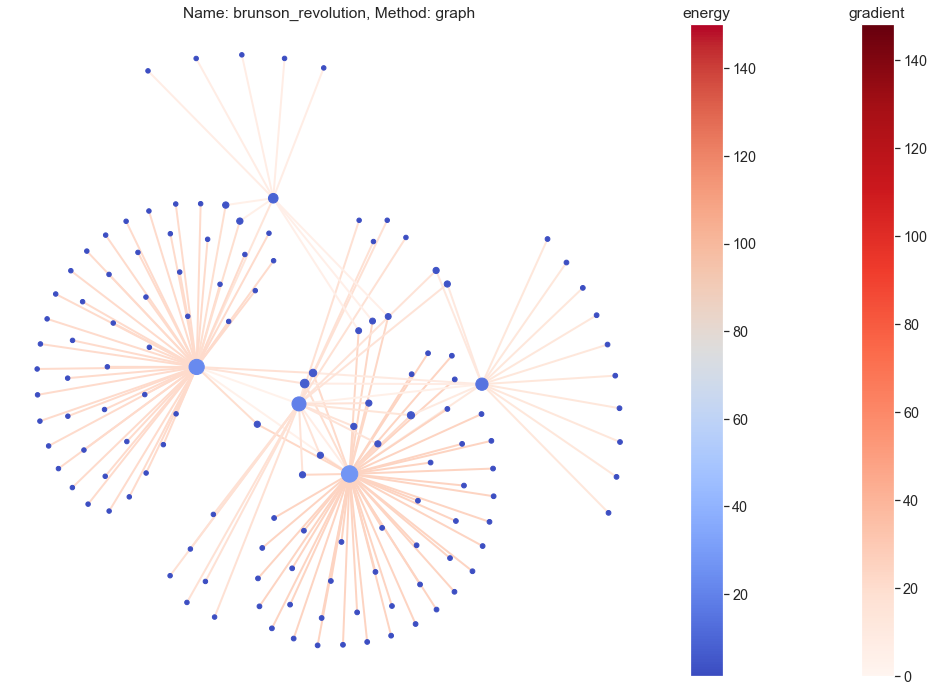

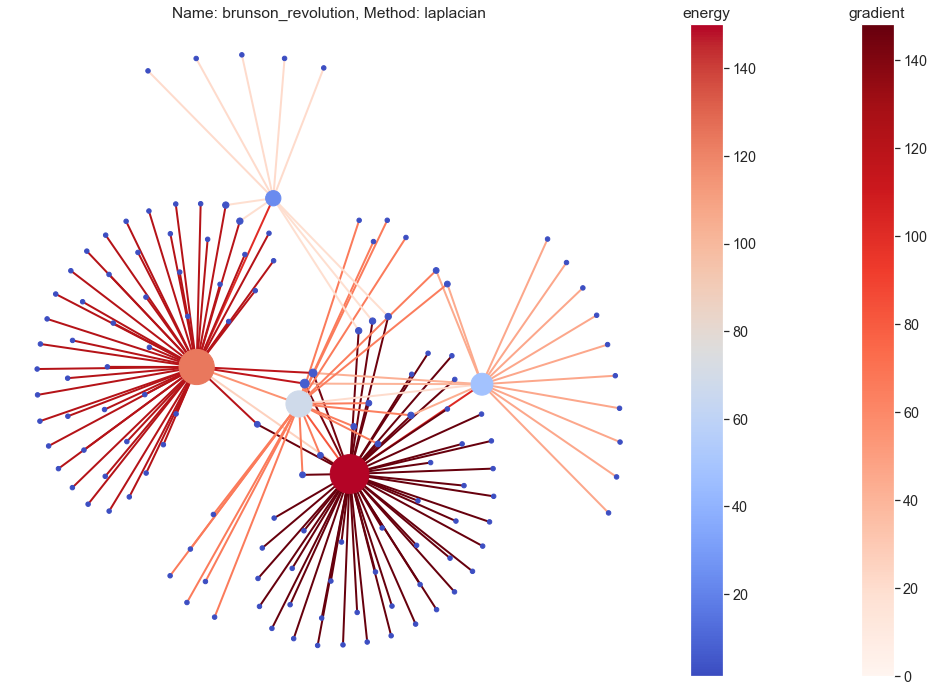

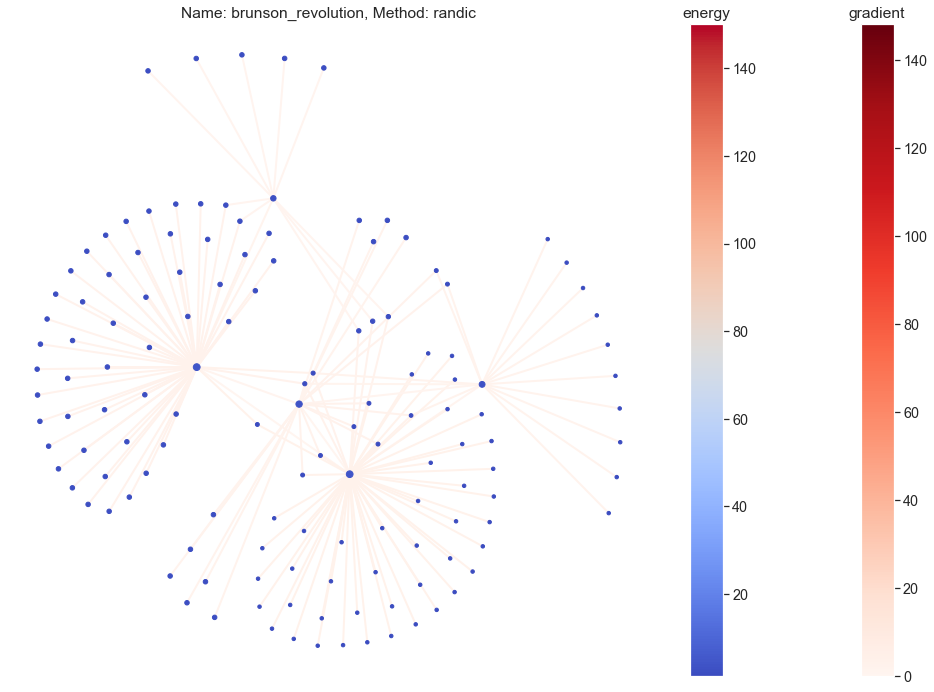

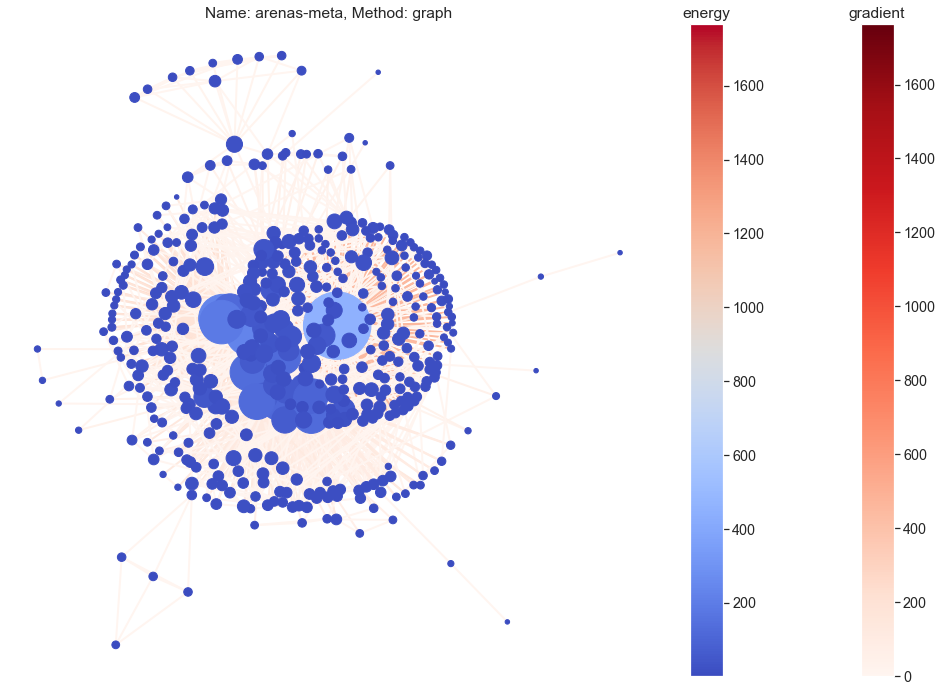

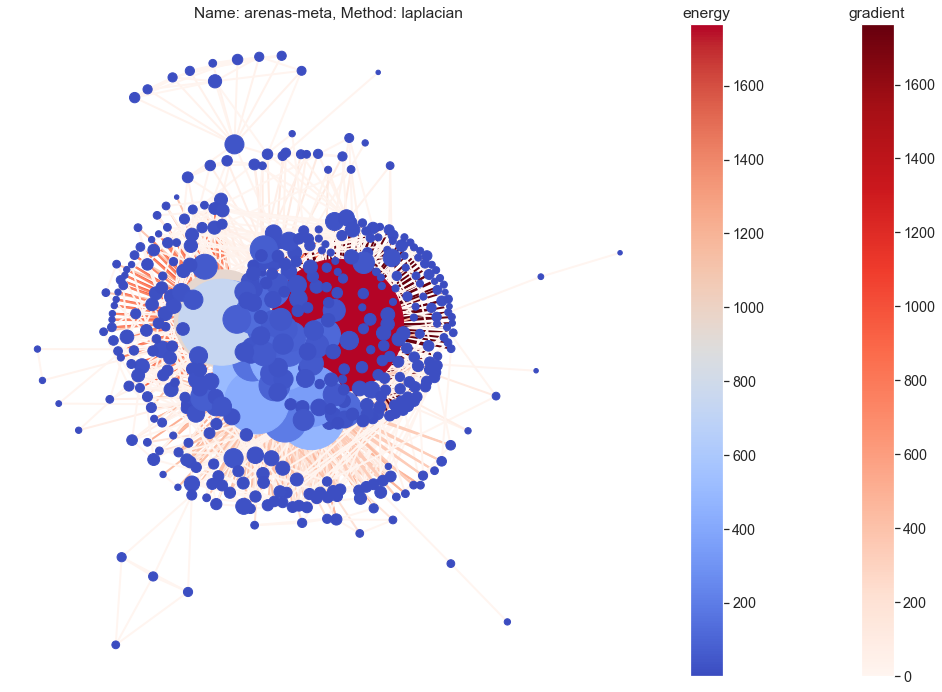

...

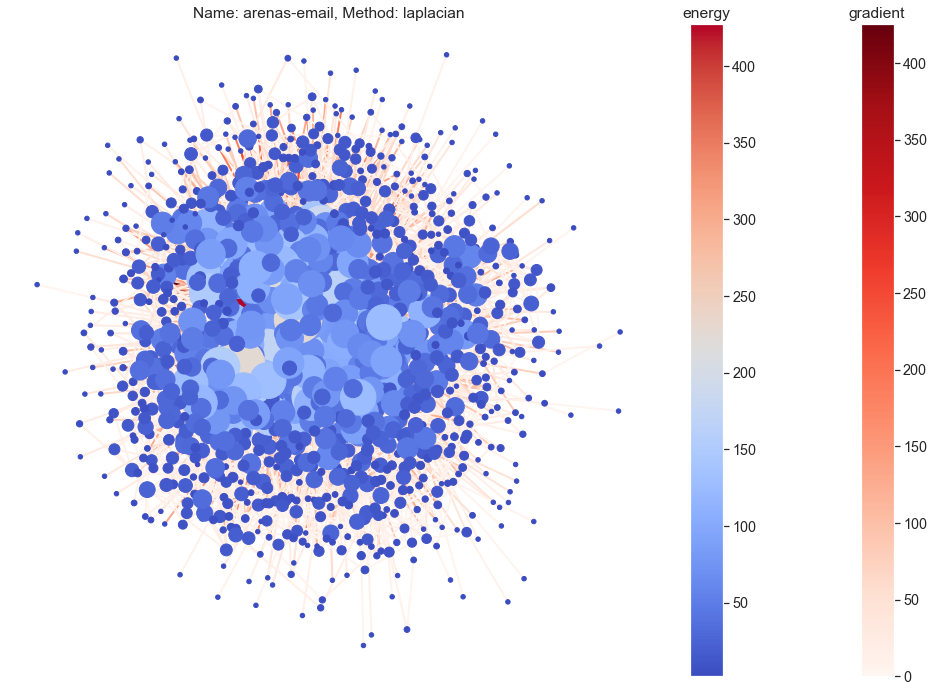

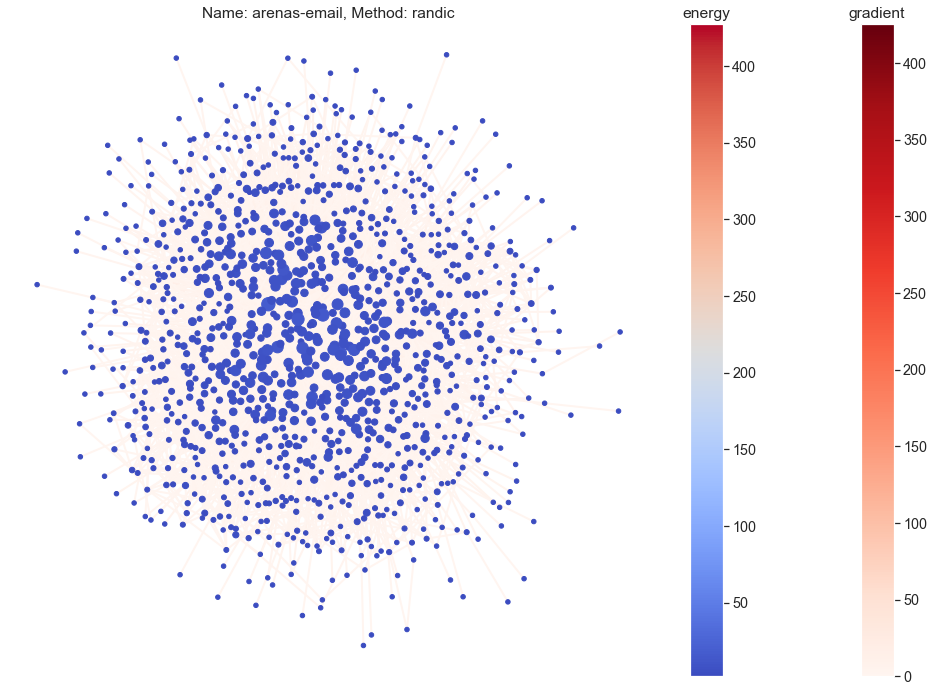

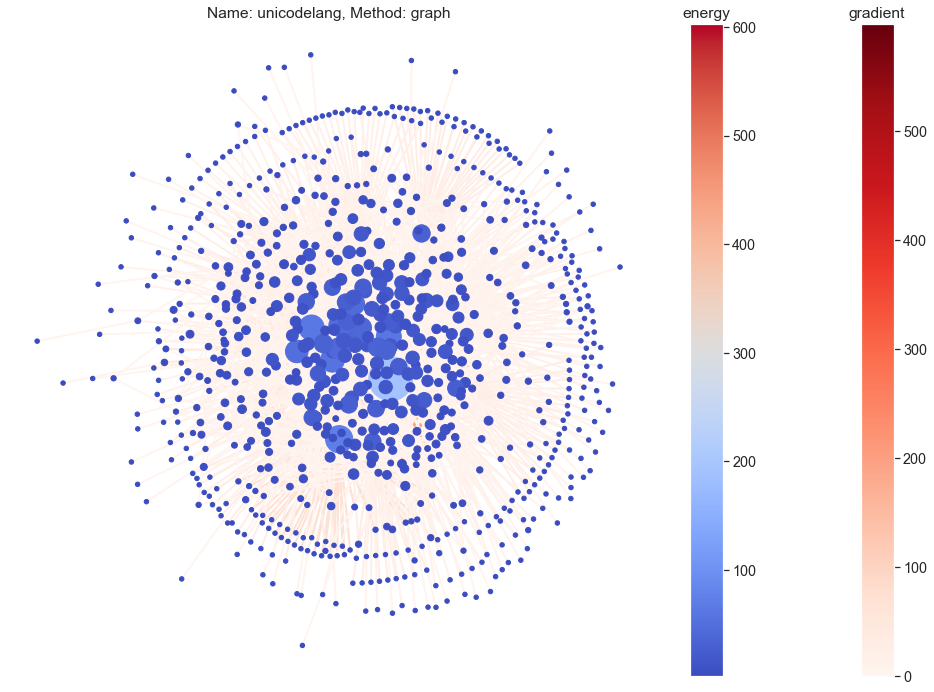

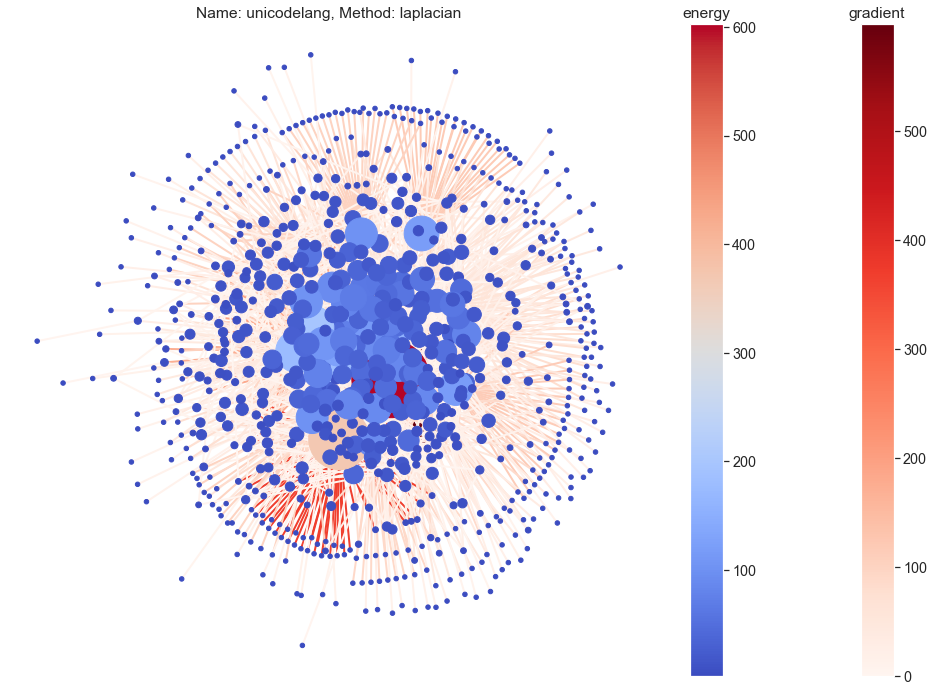

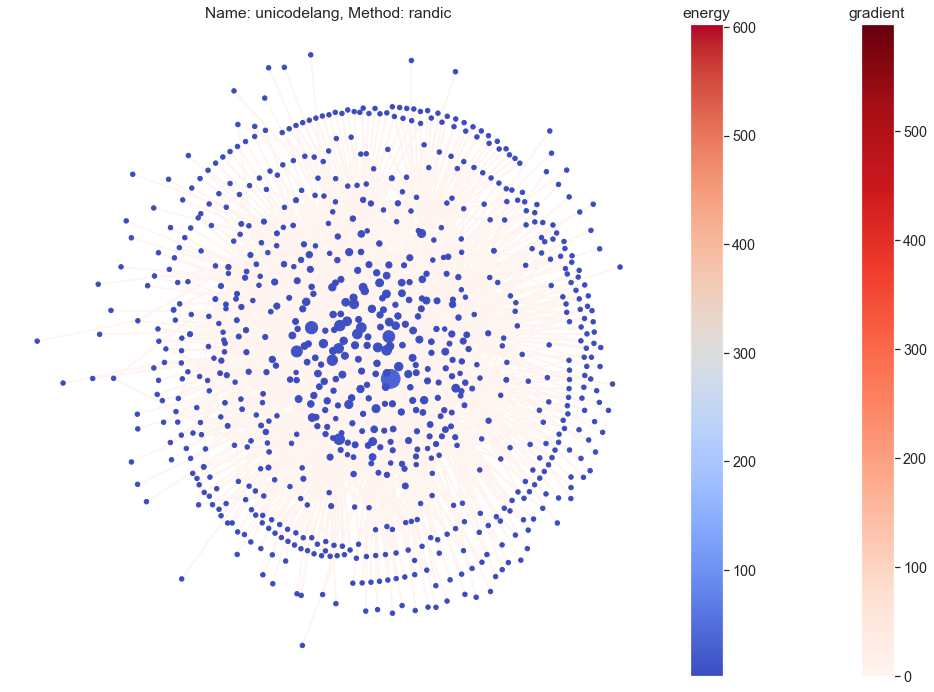

,name,method,g,energies,gradients,min_energy,max_energy,min_gradient,max_gradient
0,brunson_revolution,graph,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[26.848578421038063, 15.00152464488739, 19.639...","[0.0, 11.847053776150673, 7.209050154659451, 3...",2.000000,26.848578,0.000000e+00,2.461251e+01
1,brunson_revolution,laplacian,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[150.1469551379761, 47.9076009370411, 68.36424...","[0.0, 102.239354200935, 81.78271094562045, 26....",2.000000,150.146955,0.000000e+00,1.481470e+02
2,brunson_revolution,randic,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[4.5038676847585775, 3.400124523821385, 3.9970...","[0.0, 1.1037431609371926, 0.5068568669798821, ...",1.201850,4.598856,0.000000e+00,3.302017e+00
3,arenas-meta,graph,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[7.47213595499958, 234.1678506089869, 7.472135...","[226.69571465398732, 0.0, 75.25686355685613, 2...",2.000000,455.570704,0.000000e+00,4.521066e+02
4,arenas-meta,laplacian,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[6.8000000000000025, 951.0660018357723, 6.8000...","[944.2660018357724, 0.0, 256.4930379168671, 86...",2.000000,1766.983633,0.000000e+00,1.763650e+03
5,arenas-meta,randic,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[1.7534662148993583, 28.39616181641492, 1.7534...","[26.642695601515562, 0.0, 6.856788110166516, 2...",0.666667,62.812909,0.000000e+00,6.169488e+01
6,tntp-ChicagoRegional,graph,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[2.0, 5.6568542494923815, 2.0, 2.0, 2.0, 2.0, ...","[3.6568542494923815, 3.6568542494923815, 3.656...",2.000000,6.633250,0.000000e+00,4.633250e+00
7,tntp-ChicagoRegional,laplacian,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[2.0, 14.444444444444446, 2.0, 2.0, 2.0, 2.0, ...","[12.444444444444446, 12.444444444444446, 12.44...",2.000000,20.333333,0.000000e+00,1.833333e+01
8,tntp-ChicagoRegional,randic,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[2.0, 1.9999999999999998, 2.0, 2.0, 2.0, 2.0, ...","[2.220446049250313e-16, 2.220446049250313e-16,...",2.000000,2.000000,0.000000e+00,1.332268e-15
9,moreno_crime,graph,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[4.123105625617661, 12.692648151474739, 4.2360...","[0.0, 8.569542525857077, 0.11296235188213011, ...",2.000000,15.018566,0.000000e+00,1.159539e+01


In [319]:
draw_networks_emp(empirical_networks_to_draw_df, METHODS, vstrategy='name', vstrategy_gradient='name')

In [247]:
di_filtered_datasets_to_draw = datasets.filter(directed=True, min_size=200, max_size=500, max_density=0.1)
di_empirical_networks_to_draw_df = di_filtered_datasets_to_draw.download_and_build_networks().rename(columns={'graph': 'g'})
di_largest_component_to_draw_df = di_empirical_networks_to_draw_df.progress_apply(lambda s: get_largest_connected_component(s['g']), axis=1)
di_largest_component_n_to_draw_df = di_largest_component_to_draw_df.progress_apply(lambda g: nx.number_of_nodes(g))
print(di_largest_component_n_to_draw_df)
di_empirical_networks_to_draw_df = di_empirical_networks_to_draw_df.assign(g=di_largest_component_to_draw_df)

149    117
160    217
dtype: int64


In [248]:
di_empirical_networks_to_draw_df

,name,category,directed,num_nodes,num_edges,tsv_url,g
149,moreno_innovation,HumanSocial,True,241,1098,http://konect.uni-koblenz.de/downloads/tsv/mor...,"(96, 5, 23, 17, 67, 60, 20, 19, 10, 73, 27, 43..."
160,moreno_oz,HumanSocial,True,217,2672,http://konect.uni-koblenz.de/downloads/tsv/mor...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."


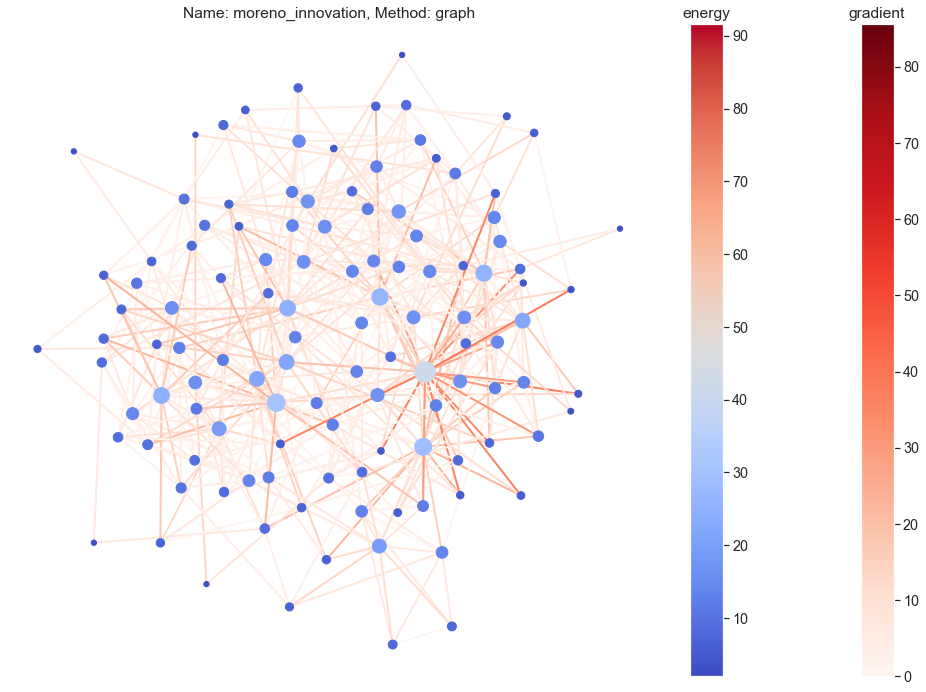

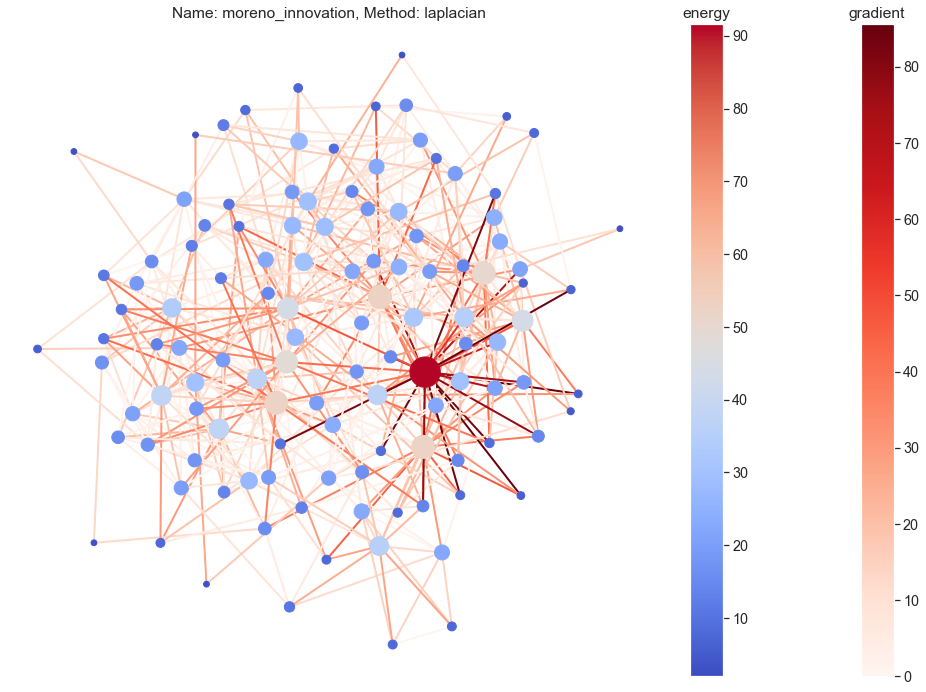

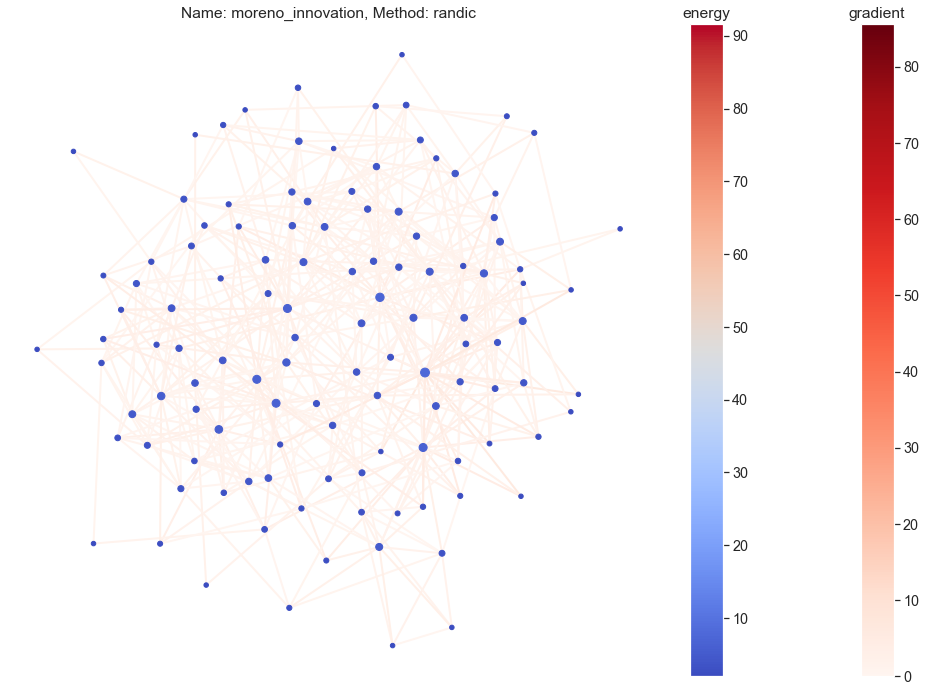

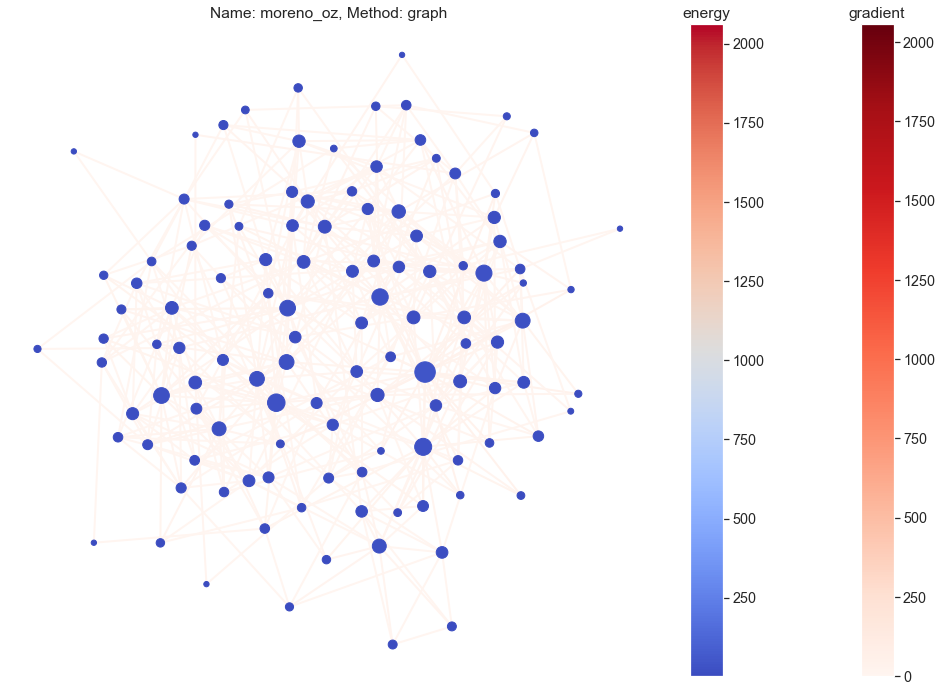

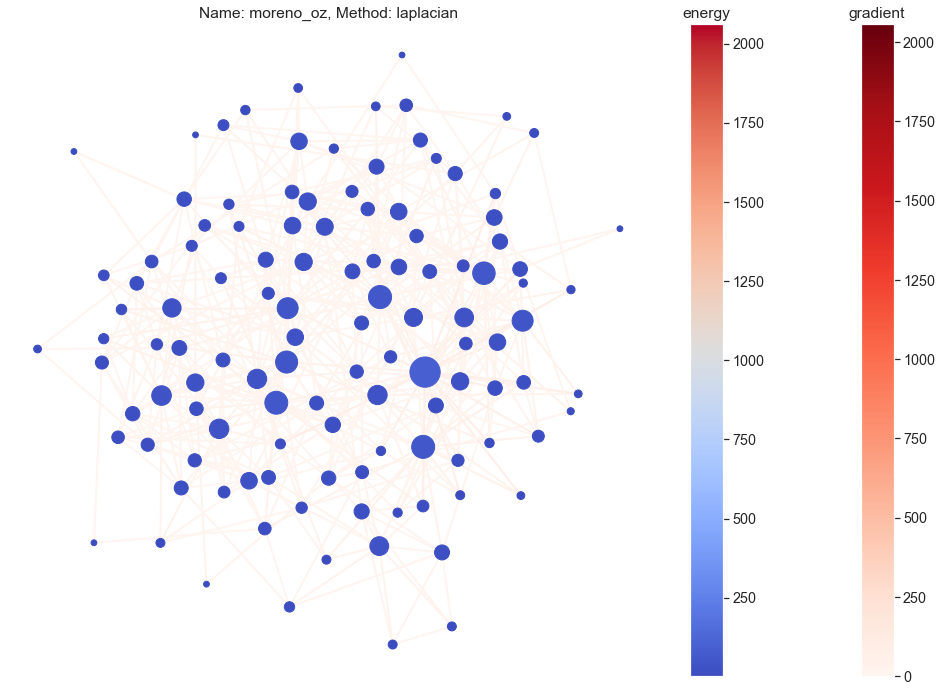

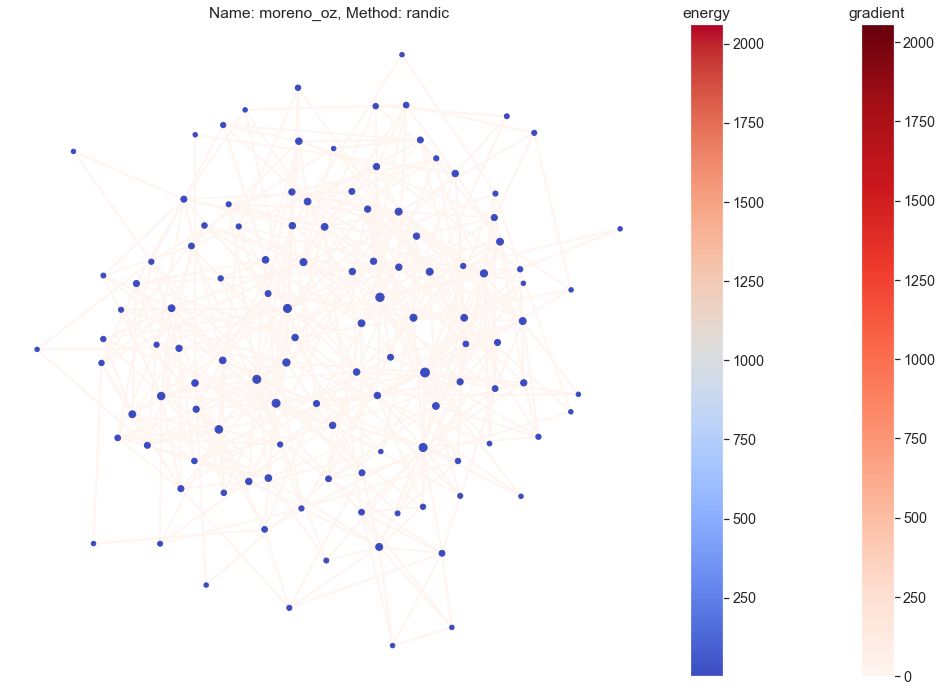

In [252]:
draw_df = draw_networks_emp(di_empirical_networks_to_draw_df, METHODS, vstrategy='name', vstrategy_gradient='name', scale_factor=1)

In [250]:
draw_df

,name,method,g,energies,gradients,min_energy,max_energy,min_gradient,max_gradient
0,moreno_innovation,graph,"(96, 5, 23, 17, 67, 60, 20, 19, 10, 73, 27, 43...","[5.1231056256176615, 16.21171830490128, 28.944...","[36.788763866713424, 16.840447604870423, 12.22...",2.828427,41.911869,0.0,37.911869
1,moreno_innovation,directed_laplacian,"(96, 5, 23, 17, 67, 60, 20, 19, 10, 73, 27, 43...","[5.999999999999998, 33.639568964874044, 52.755...","[85.61095449258778, 37.90461021712912, 31.1790...",3.333333,91.610954,0.0,85.610954
2,moreno_innovation,randic,"(96, 5, 23, 17, 67, 60, 20, 19, 10, 73, 27, 43...","[2.0, 4.590662406254566, 6.445835124996002, 3....","[5.818344798439607, 2.8535778715974223, 2.1167...",2.000000,7.818345,0.0,5.818345
3,moreno_oz,graph,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[40.08105200952303, 75.42977169840525, 672.170...","[35.34871968888222, 632.0894223882184, 578.245...",5.605551,672.170474,0.0,666.564923
4,moreno_oz,directed_laplacian,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[94.85900416585288, 193.01512937472782, 2062.0...","[98.15612520887494, 1967.187374646566, 1798.03...",5.000000,2062.046379,0.0,2057.046379
5,moreno_oz,randic,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[5.07782467967082, 7.369394024478499, 34.33130...","[2.2915693448076793, 29.253484379026894, 26.44...",1.565297,34.331309,0.0,32.766012
